In [1]:
import custom_functions_scviEnv as cf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.stats as stats
import seaborn as sns
import warnings
from custom_functions_scviEnv import proportion_plot
from matplotlib.colors import ListedColormap

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=150, frameon=True, vector_friendly=True, 
                     fontsize=14, figsize=None, color_map=None, format='png', facecolor=None, 
                     transparent=False, ipython_format='png2x')

In [2]:
warnings.filterwarnings("ignore")

## Loading Data

In [3]:
adata = sc.read_h5ad('../data/taPVAT_combined_annotated_with_immune_fibro_ecs.h5ad')

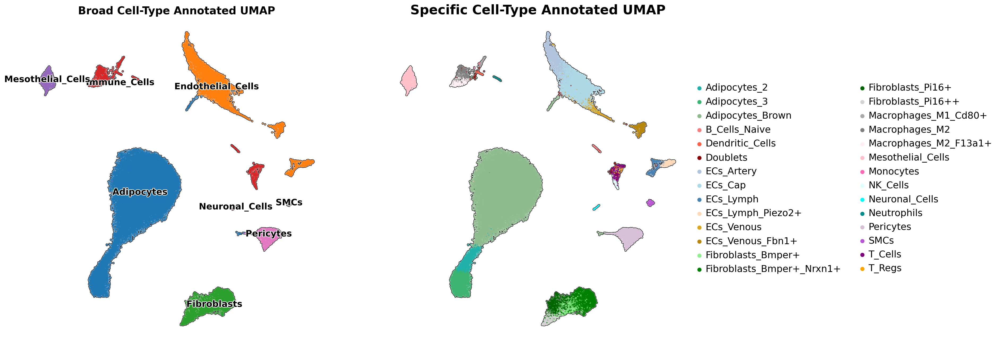

In [4]:
###Plotting single graph of all cells
fig = plt.figure(figsize = (20,10))
widths = [1, 1]

gs = fig.add_gridspec(ncols=2, nrows=1, width_ratios=widths)
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
    
sc.pl.umap(adata, ax = ax1, color='celltype_broad', add_outline=True, size = 20, 
        legend_loc='on data', legend_fontsize=15, legend_fontoutline=2,frameon=False,
        title='', palette = cf.bright_palette, show = False)

sc.pl.umap(adata, ax = ax2, color='celltype', add_outline=True, size = 20, 
        legend_loc='right margin', legend_fontsize=16, legend_fontoutline=2,frameon=False,
        title='', palette = cf.large_palette, show = False)

ax1.set_title('Broad Cell-Type Annotated UMAP', fontsize=18, fontweight = 'bold')
ax2.set_title('Specific Cell-Type Annotated UMAP', fontsize=22, fontweight = 'bold')

plt.show()

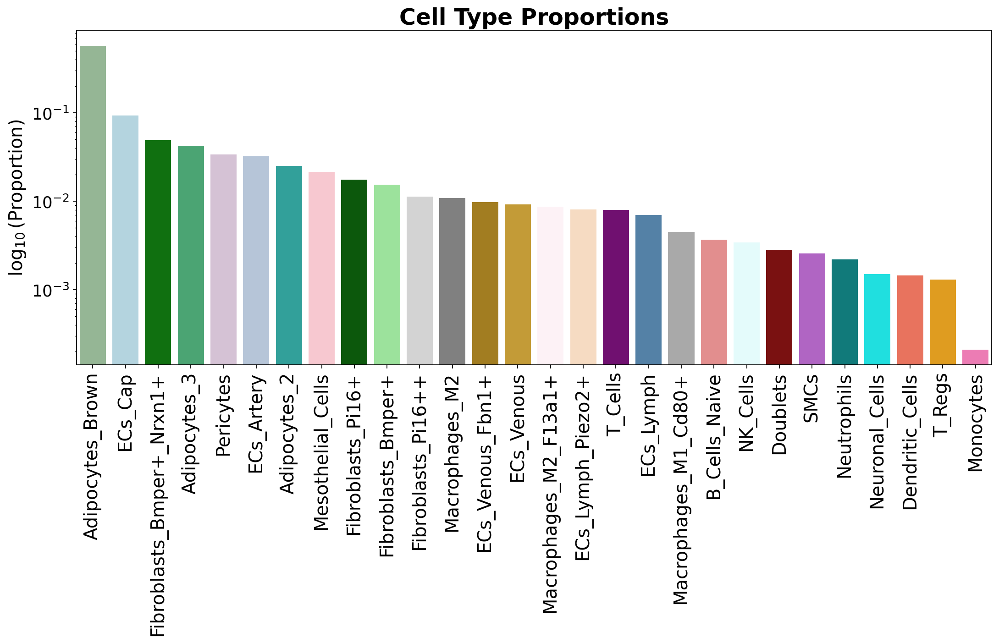

In [5]:
list = ['Adipocytes_Brown', 'ECs_Cap', 'Fibroblasts_Bmper+_Nrxn1+', 'Adipocytes_3', 'Pericytes', 'ECs_Artery', 'Adipocytes_2',
        'Mesothelial_Cells', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+', 'Fibroblasts_Pi16++', 'Macrophages_M2', 'ECs_Venous_Fbn1+', 
        'ECs_Venous', 'Macrophages_M2_F13a1+', 'ECs_Lymph_Piezo2+', 'T_Cells', 'ECs_Lymph', 'Macrophages_M1_Cd80+', 'B_Cells_Naive', 
        'NK_Cells', 'Doublets', 'SMCs', 'Neutrophils', 'Neuronal_Cells', 'Dendritic_Cells', 'T_Regs', 'Monocytes']


color = dict(zip(list, cf.large_palette))

# Adjust font sizes
plt.rcParams.update({'font.size': 16,   # Increase font size for tick labels, axis labels, and legend
                     'axes.titlesize': 22,  # Increase font size for title
                     'axes.labelsize': 20,  # Increase font size for axis labels
                     'xtick.labelsize': 20, # Increase font size for x-axis tick labels
                     'ytick.labelsize': 16})# Increase font size for y-axis tick labels
# Get the colors used in the UMAP plot
umap_colors = adata.uns['celltype_colors']

fig, ax = plt.subplots(figsize = (16,6))

N = len(adata)
j = 0
props_dict = {"Cell Type":[], "Proportion":[], "Color":[]}
for i in np.unique(adata.obs.celltype):
    i_len = len(adata[adata.obs.celltype == i])
    props_dict["Cell Type"].append(i)
    props_dict["Proportion"].append(i_len/N)
    props_dict["Color"].append(umap_colors[j])  # Map the exact color used in the UMAP plot
    j+=1
props_df = pd.DataFrame(props_dict)

sns.barplot(x = "Cell Type", y = "Proportion", ax = ax, data = props_df, log = True, palette = props_df.sort_values(by = 'Proportion', ascending = False).Color,
            order = props_df.sort_values("Proportion", ascending = False)["Cell Type"])
plt.xticks(rotation = 90, fontsize = 18)
plt.xlabel('')
plt.ylabel(r'$\log_{10}(\mathrm{Proportion})$', fontsize=18)
#plt.ylabel("log10(Proportion)")
plt.title('Cell Type Proportions', fontweight = 'bold')  # Add title
ax.grid(False)

#plt.savefig('../output/taPVAT_high_level_proportions_labeled.png', bbox_inches = "tight")
plt.show()

In [6]:
props_df

,Cell Type,Proportion,Color
0,Adipocytes_2,0.024968,#20b2aa
1,Adipocytes_3,0.042499,#3cb371
2,Adipocytes_Brown,0.574019,#8fbc8f
3,B_Cells_Naive,0.003676,#f08080
4,Dendritic_Cells,0.001448,#ff6347
5,Doublets,0.002813,#8b0000
6,ECs_Artery,0.032083,#b0c4de
7,ECs_Cap,0.092936,#add8e6
8,ECs_Lymph,0.006976,#4682b4
9,ECs_Lymph_Piezo2+,0.008118,#ffdab9


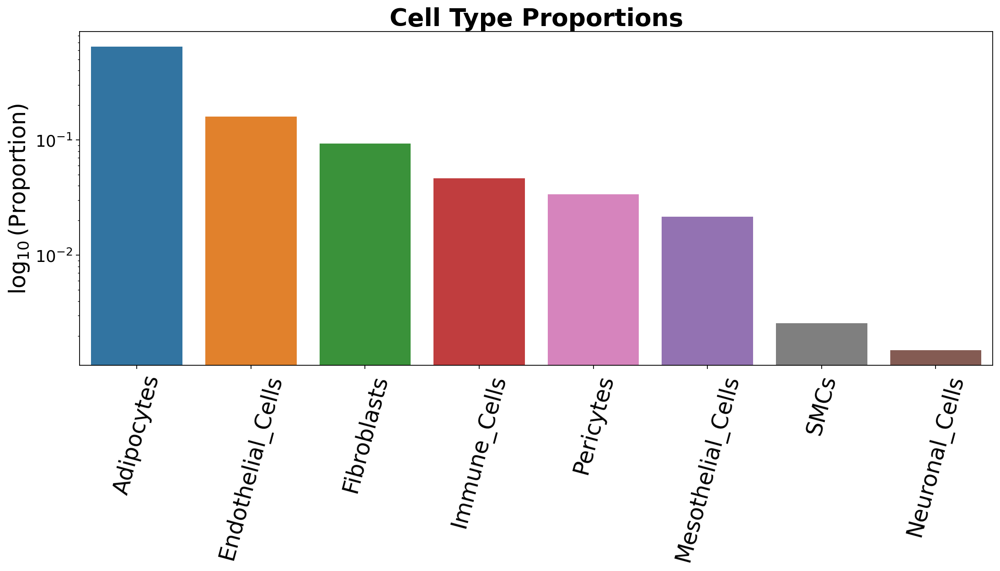

In [6]:
list = ['Adipocytes', 'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells', 'Mesothelial_Cells', 'Neuronal_Cells', 'Pericytes', 'SMCs']
color = dict(zip(list, adata.uns['celltype_broad_colors']))

# Adjust font sizes
plt.rcParams.update({'font.size': 16,   # Increase font size for tick labels, axis labels, and legend
                     'axes.titlesize': 24,  # Increase font size for title
                     'axes.labelsize': 20,  # Increase font size for axis labels
                     'xtick.labelsize': 20, # Increase font size for x-axis tick labels
                     'ytick.labelsize': 16})# Increase font size for y-axis tick labels
# Get the colors used in the UMAP plot
umap_colors = adata.uns['celltype_broad_colors']

fig, ax = plt.subplots(figsize = (16,6))

N = len(adata)
j = 0
props_dict = {"Cell Type":[], "Proportion":[], "Color":[]}
for i in np.unique(adata.obs.celltype_broad):
    i_len = len(adata[adata.obs.celltype_broad == i])
    props_dict["Cell Type"].append(i)
    props_dict["Proportion"].append(i_len/N)
    props_dict["Color"].append(umap_colors[j])  # Map the exact color used in the UMAP plot
    j+=1
props_df = pd.DataFrame(props_dict)

sns.barplot(x = "Cell Type", y = "Proportion", ax = ax, data = props_df, log = True, palette=color,
            order = props_df.sort_values("Proportion", ascending = False)["Cell Type"])
plt.xticks(rotation = 75, fontsize = 22)
plt.xlabel('')
plt.ylabel(r'$\log_{10}(\mathrm{Proportion})$', fontsize=22)
#plt.ylabel("log10(Proportion)")
plt.title('Cell Type Proportions', fontweight = 'bold')  # Add title
ax.grid(False)

#plt.savefig('../output/taPVAT_high_level_proportions_labeled.png', bbox_inches = "tight")
plt.show()


In [8]:
props_df

,Cell Type,Proportion,Color
0,Adipocytes,0.641486,#1f77b4
1,Endothelial_Cells,0.159595,#ff7f0e
2,Fibroblasts,0.093075,#2ca02c
3,Immune_Cells,0.046551,#d62728
4,Mesothelial_Cells,0.021528,#9467bd
5,Neuronal_Cells,0.001504,#8c564b
6,Pericytes,0.033685,#e377c2
7,SMCs,0.002576,#7f7f7f


## Stacked bar plot of mean cell proportions across treatments

In [9]:
df_len = len(adata.obs.sample_id.unique()) * len(adata.obs.celltype_broad.unique())
df = pd.DataFrame(index=range(df_len),
                  columns = ['sample_id', 'tissue', 'diet', 'time', 'sex', 'celltype', 'celltype_number', 'total_number'])

i = 0
for sample_id in adata.obs.sample_id.unique():
    df_sample = adata.obs[adata.obs.sample_id == sample_id]
    for celltype in adata.obs.celltype_broad.unique():
            df.sample_id.iloc[i] = sample_id
            df.celltype.iloc[i] = celltype
            df.tissue.iloc[i] = df_sample.tissue.iloc[0]
            df.diet.iloc[i] = df_sample.diet.iloc[0]
            df.time.iloc[i] = df_sample.time.iloc[0]
            df.sex.iloc[i] = df_sample.sex.iloc[0]
            df.total_number.iloc[i] = len(df_sample)
            df.celltype_number.iloc[i] = len(df_sample[df_sample.celltype_broad == celltype])
            i+=1
df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936


In [10]:
### Calculate proportion for each row
df['proportion'] = df.celltype_number / df.total_number

# convert columns to numeric
df[["celltype_number", "total_number", "proportion"]] = df[["celltype_number", "total_number", "proportion"]].apply(pd.to_numeric)

df['sample_type'] = df.tissue + '_'+ df.diet + '_' + df.time + '_' + df.sex

df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936,0.197831,taPVAT_Control_8W_M
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936,0.471591,taPVAT_Control_8W_M
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936,0.106921,taPVAT_Control_8W_M
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936,0.122934,taPVAT_Control_8W_M
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936,0.061467,taPVAT_Control_8W_M


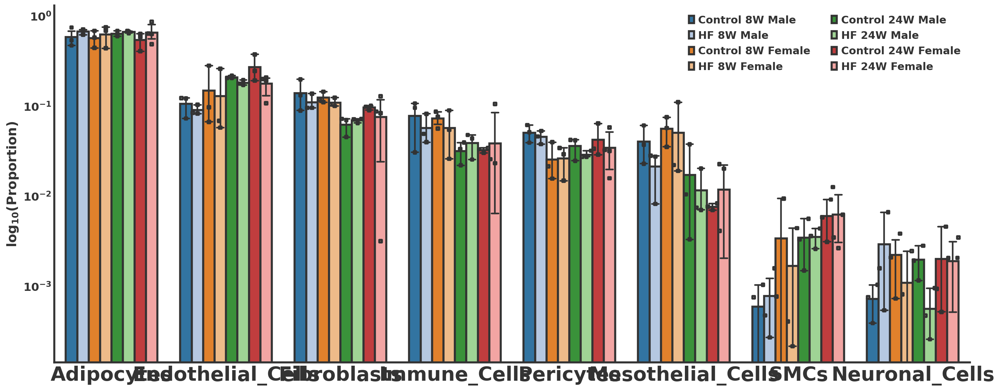

In [14]:
plt.figure(figsize = (20,8))
plt.style.use("seaborn-white")

group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']

cell_type_order = ['Adipocytes',  'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells',
                   'Pericytes', 'Mesothelial_Cells',  'SMCs', 'Neuronal_Cells']

legend_labels = ['Control 8W Male', 'HF 8W Male', 'Control 8W Female', 'HF 8W Female', 
              'Control 24W Male', 'HF 24W Male', 'Control 24W Female', 'HF 24W Female',
                 'Control 8W Male', 'HF 8W Male', 'Control 8W Female', 'HF 8W Female', 
              'Control 24W Male', 'HF 24W Male', 'Control 24W Female', 'HF 24W Female']

ax = sns.barplot(data = df, x = 'celltype', y = 'proportion', capsize = 0.06, edgecolor = '0.2', lw = 2.5, errwidth = 2, 
                palette = 'tab20', errcolor = '0.2', hue = 'sample_type', order = cell_type_order, hue_order = group_order)

kwargs = {'edgecolor':'0.2', 'linewidth':2.5, 'fc': 'none'}

ax = sns.swarmplot(data = df, x = 'celltype', y = 'proportion', hue = 'sample_type',
                   dodge = 0.4, marker = 's', s = 3, order = cell_type_order, hue_order = group_order, **kwargs)

prev_lim = ax.get_ylim()[1]

#max_val = max(vals)


handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[8:], legend_labels[8:], loc = 'upper right', # bbox_to_anchor = (1, 0), 
          ncol = 2, frameon = False, fontsize = 18, labelcolor = '0.2', prop = {'weight': 'bold'})



for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_yscale('log')

plt.xticks(size = 14, ha = 'center', weight = 'bold', color = '0.2')
plt.yticks(size = 14, weight = 'bold', color = '0.2')

ax.tick_params(width = 2.5, color = '0.2')

plt.xlabel('')
plt.ylabel(r'$\mathbf{log_{10}(\mathrm{\mathbf{Proportion}})}$', size = 16, color = '0.2')

#plt.ylim(top = prev_lim)


plt.savefig('../output/barplot.svg', bbox_inches = 'tight')
plt.savefig('../output/barplot.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
plt.show()

In [8]:
df.to_csv('../data/celltype_proportions.csv', index = False)

In [9]:
df = pd.read_csv('../data/celltype_proportions.csv')

In [10]:
df

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936,0.197831,taPVAT_Control_8W_M
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936,0.471591,taPVAT_Control_8W_M
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936,0.106921,taPVAT_Control_8W_M
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936,0.122934,taPVAT_Control_8W_M
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936,0.061467,taPVAT_Control_8W_M
...,...,...,...,...,...,...,...,...,...,...
195,P_HF_8W_F_03,taPVAT,HF,8W,F,Endothelial_Cells,268,4646,0.057684,taPVAT_HF_8W_F
196,P_HF_8W_F_03,taPVAT,HF,8W,F,Pericytes,69,4646,0.014851,taPVAT_HF_8W_F
197,P_HF_8W_F_03,taPVAT,HF,8W,F,Mesothelial_Cells,103,4646,0.022170,taPVAT_HF_8W_F
198,P_HF_8W_F_03,taPVAT,HF,8W,F,Neuronal_Cells,0,4646,0.000000,taPVAT_HF_8W_F


In [7]:
from scipy import stats

In [27]:
def prop_stat(sample_type_1, sample_type_2):
    stat, pvalue = stats.ttest_ind(df[df.celltype == celltype][df.sample_type == sample_type_1].proportion,
                   df[df.celltype == celltype][df.sample_type == sample_type_2].proportion, equal_var = False
    )
    celltype_ls.append(celltype)
    sample_type_1_ls.append(sample_type_1)
    sample_type_2_ls.append(sample_type_2)
    pvalue_ls.append(pvalue)

In [50]:
celltype_ls = []
sample_type_1_ls = []
sample_type_2_ls = []
pvalue_ls = []

for celltype in df.celltype.unique():
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_HF_8W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_Control_24W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_24W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_HF_8W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_8W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_24W_M', 'taPVAT_HF_24W_F')
    

In [51]:
dict = {'celltype': celltype_ls, 'sample_type_1': sample_type_1_ls, 'sample_type_2': sample_type_2_ls, 'pvalue': pvalue_ls} 
df_stats = pd.DataFrame(dict)

In [52]:
df_stats[df_stats.pvalue <= 0.05]

,celltype,sample_type_1,sample_type_2,pvalue
10,Fibroblasts,taPVAT_Control_24W_M,taPVAT_Control_24W_F,0.043773
29,Immune_Cells,taPVAT_Control_8W_F,taPVAT_Control_24W_F,0.042843
38,Endothelial_Cells,taPVAT_Control_24W_M,taPVAT_HF_24W_M,0.035794
40,Endothelial_Cells,taPVAT_Control_8W_M,taPVAT_Control_24W_M,0.019034
42,Endothelial_Cells,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.000702
90,SMCs,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.015299


## Try for specific cell types

In [8]:
df_len = len(adata.obs.sample_id.unique()) * len(adata.obs.celltype.unique())
df = pd.DataFrame(index=range(df_len),
                  columns = ['sample_id', 'tissue', 'diet', 'time', 'sex', 'celltype', 'celltype_number', 'total_number'])

i = 0
for sample_id in adata.obs.sample_id.unique():
    df_sample = adata.obs[adata.obs.sample_id == sample_id]
    for celltype in adata.obs.celltype.unique():
            df.sample_id.iloc[i] = sample_id
            df.celltype.iloc[i] = celltype
            df.tissue.iloc[i] = df_sample.tissue.iloc[0]
            df.diet.iloc[i] = df_sample.diet.iloc[0]
            df.time.iloc[i] = df_sample.time.iloc[0]
            df.sex.iloc[i] = df_sample.sex.iloc[0]
            df.total_number.iloc[i] = len(df_sample)
            df.celltype_number.iloc[i] = len(df_sample[df_sample.celltype == celltype])
            i+=1
df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts_Bmper+_Nrxn1+,251,1936
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_2,51,1936
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Macrophages_M2,41,1936
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_Brown,780,1936
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,ECs_Venous_Fbn1+,30,1936


In [9]:
### Calculate proportion for each row
df['proportion'] = df.celltype_number / df.total_number

# convert columns to numeric
df[["celltype_number", "total_number", "proportion"]] = df[["celltype_number", "total_number", "proportion"]].apply(pd.to_numeric)

df['sample_type'] = df.tissue + '_'+ df.diet + '_' + df.time + '_' + df.sex

df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts_Bmper+_Nrxn1+,251,1936,0.129649,taPVAT_Control_8W_M
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_2,51,1936,0.026343,taPVAT_Control_8W_M
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Macrophages_M2,41,1936,0.021178,taPVAT_Control_8W_M
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes_Brown,780,1936,0.402893,taPVAT_Control_8W_M
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,ECs_Venous_Fbn1+,30,1936,0.015496,taPVAT_Control_8W_M


In [10]:
df.sort_values(['celltype_number'], ascending = False).celltype.unique()

array(['Adipocytes_Brown', 'ECs_Cap', 'Adipocytes_3', 'Adipocytes_2',
       'Fibroblasts_Bmper+_Nrxn1+', 'ECs_Artery', 'Mesothelial_Cells',
       'Pericytes', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+',
       'Macrophages_M2', 'T_Cells', 'Fibroblasts_Pi16++', 'ECs_Venous',
       'ECs_Venous_Fbn1+', 'ECs_Lymph', 'Macrophages_M1_Cd80+',
       'ECs_Lymph_Piezo2+', 'Macrophages_M2_F13a1+', 'NK_Cells',
       'B_Cells_Naive', 'SMCs', 'Neutrophils', 'Doublets', 'T_Regs',
       'Neuronal_Cells', 'Dendritic_Cells', 'Monocytes'], dtype=object)

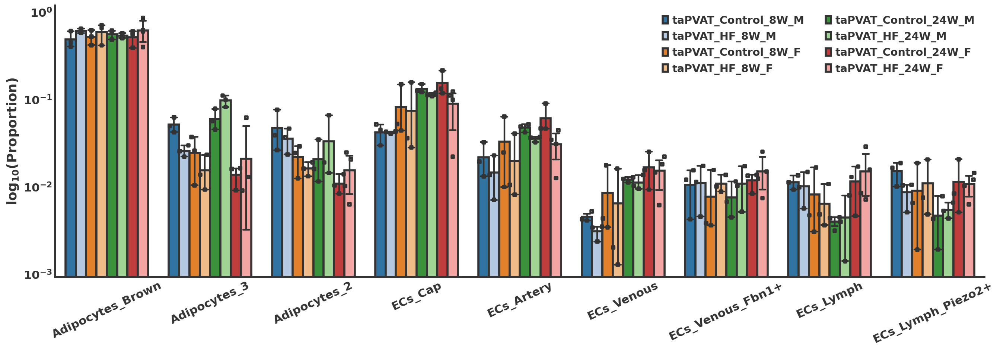

In [55]:
plt.figure(figsize = (20,6))
plt.style.use("seaborn-white")

group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']

cell_type_order = ['Adipocytes_Brown', 'Adipocytes_3', 'Adipocytes_2', 'ECs_Cap', 
                    'ECs_Artery', 'ECs_Venous', 'ECs_Venous_Fbn1+', 'ECs_Lymph', 'ECs_Lymph_Piezo2+',
                   
                   # 'Fibroblasts_Bmper+_Nrxn1+', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+',
                   # 'Fibroblasts_Pi16++', 'Pericytes', 'Mesothelial_Cells', 'SMCs', 'Doublets', 'Neuronal_Cells',
                   
                   #  
                   # 'Macrophages_M2', 'T_Cells',  
                   # 'Macrophages_M1_Cd80+',
                   #  'Macrophages_M2_F13a1+', 'NK_Cells',
                   # 'B_Cells_Naive',  'Neutrophils',  'T_Regs',
                   #  'Dendritic_Cells', 'Monocytes'
                  ]

ax = sns.barplot(data = df, x = 'celltype', y = 'proportion', capsize = 0.06, edgecolor = '0.2', lw = 2.5, errwidth = 2, 
                palette = 'tab20', errcolor = '0.2', hue = 'sample_type', order = cell_type_order, hue_order = group_order)

kwargs = {'edgecolor':'0.2', 'linewidth':2.5, 'fc': 'none'}

ax = sns.swarmplot(data = df, x = 'celltype', y = 'proportion', hue = 'sample_type',
                   dodge = 0.4, marker = 's', s = 3, order = cell_type_order, hue_order = group_order, **kwargs)

prev_lim = ax.get_ylim()[1]

#max_val = max(vals)


handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[8:], labels[8:], loc = 'upper right', # bbox_to_anchor = (1, 0), 
          ncol = 2, frameon = False, fontsize = 14, labelcolor = '0.2', prop = {'weight': 'bold'})



for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_yscale('log')

plt.xticks(size = 14, ha = 'center', weight = 'bold', color = '0.2', rotation = 25)
plt.yticks(size = 14, weight = 'bold', color = '0.2')

ax.tick_params(width = 2.5, color = '0.2')

plt.xlabel('')
plt.ylabel(r'$\mathbf{log_{10}(\mathrm{\mathbf{Proportion}})}$', size = 16, color = '0.2')

#plt.ylim(top = prev_lim)


plt.savefig('barplot_specific.svg', bbox_inches = 'tight')
# plt.savefig('barplot_specific.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
#plt.show()

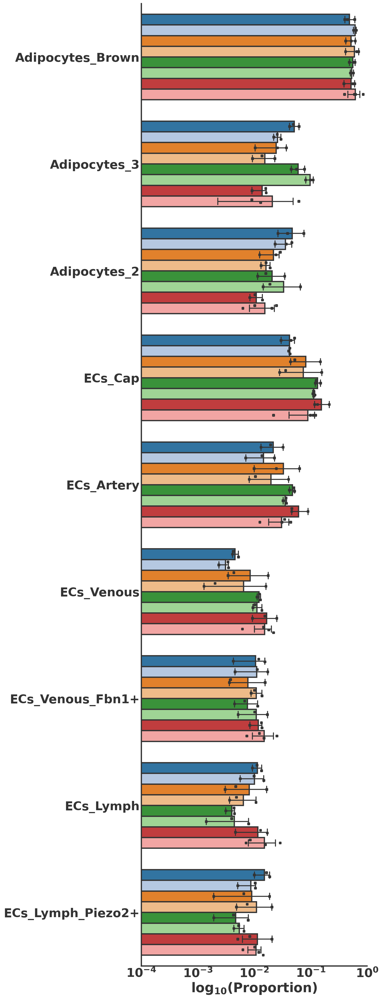

In [25]:
plt.figure(figsize = (8, 35))  # Adjust the figure size for a vertical plot
plt.style.use("seaborn-white")

group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']

# cell_type_order = ['Adipocytes_Brown', 'ECs_Cap', 'Adipocytes_3', 'Adipocytes_2',
#                    'Fibroblasts_Bmper+_Nrxn1+', 'ECs_Artery', 'Mesothelial_Cells',
#                    'Pericytes', 'Fibroblasts_Pi16+', #'Fibroblasts_Bmper+',
#                    #'Macrophages_M2', 'T_Cells', 'Fibroblasts_Pi16++', 'ECs_Venous',
#                    #'ECs_Venous_Fbn1+', 'ECs_Lymph', 'Macrophages_M1_Cd80+',
#                    #'ECs_Lymph_Piezo2+', 'Macrophages_M2_F13a1+', 'NK_Cells',
#                    #'B_Cells_Naive', 'SMCs', 'Neutrophils', 'Doublets', 'T_Regs',
#                    #'Neuronal_Cells', 'Dendritic_Cells', 'Monocytes'
#                   ]

cell_type_order = ['Adipocytes_Brown', 'Adipocytes_3', 'Adipocytes_2', 'ECs_Cap', 
                    'ECs_Artery', 'ECs_Venous', 'ECs_Venous_Fbn1+', 'ECs_Lymph', 'ECs_Lymph_Piezo2+',
                   
                   # 'Fibroblasts_Bmper+_Nrxn1+', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+',
                   # 'Fibroblasts_Pi16++', 'Pericytes', 'Mesothelial_Cells', 'SMCs', 'Doublets', 'Neuronal_Cells',
                   
                   #  
                   # 'Macrophages_M2', 'T_Cells',  
                   # 'Macrophages_M1_Cd80+',
                   #  'Macrophages_M2_F13a1+', 'NK_Cells',
                   # 'B_Cells_Naive',  'Neutrophils',  'T_Regs',
                   #  'Dendritic_Cells', 'Monocytes'
                  ]

# Swap x and y in the barplot
ax = sns.barplot(data = df, y = 'celltype', x = 'proportion', capsize = 0.06, edgecolor = '0.2', lw = 2.5, errwidth = 2, 
                palette = 'tab20', errcolor = '0.2', hue = 'sample_type', order = cell_type_order, hue_order = group_order)

kwargs = {'edgecolor':'0.2', 'linewidth':2.5, 'fc': 'none'}

# Swap x and y in the swarmplot
ax = sns.swarmplot(data = df, y = 'celltype', x = 'proportion', hue = 'sample_type',
                   dodge = 0.4, marker = 's', s = 3, order = cell_type_order, hue_order = group_order, **kwargs)

prev_lim = ax.get_xlim()[1]  # Get x-limit instead of y-limit now

# handles, labels = ax.get_legend_handles_labels()

# plt.legend(handles[8:], labels[8:], loc = 'lower right', # bbox_to_anchor = (1, 0), 
#           ncol = 1, frameon = False, fontsize = 18, labelcolor = '0.2', prop = {'weight': 'bold'})

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
leg = plt.legend()
 
ax.get_legend().set_visible(False)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xscale('log')  # Use log scale for x-axis now

plt.xlim(10**(-4), 10**(0))

# Adjust the margins to fit the long y-tick labels

plt.xticks(size = 24, weight = 'bold', color = '0.2')
plt.yticks(size = 24, weight = 'bold', color = '0.2')  # Ensure no rotation for y-axis labels

ax.tick_params(width = 2.5, color = '0.2')

plt.ylabel('')
plt.xlabel(r'$\mathbf{log_{10}(\mathrm{\mathbf{Proportion}})}$', size = 26, color = '0.2')

plt.savefig('vertical_barplot_specific.svg', bbox_inches = 'tight', transparent=True)
# plt.savefig('vertical_barplot_specific.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
#plt.show()


In [17]:
plt.figure(figsize = (8, 40))  # Adjust the figure size for a vertical plot
plt.style.use("seaborn-white")

group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F']

cell_type_order = ['Adipocytes_Brown', 'Adipocytes_3', 'Adipocytes_2', \
                   'ECs_Cap', 'ECs_Artery', 'ECs_Venous', 'ECs_Venous_Fbn1+', 'ECs_Lymph', 'ECs_Lymph_Piezo2+', 
                   'Fibroblasts_Bmper+_Nrxn1+', 'Fibroblasts_Pi16+', 'Fibroblasts_Bmper+', 'Fibroblasts_Pi16++',
                   'Macrophages_M2', 'T_Cells','Macrophages_M1_Cd80+','Macrophages_M2_F13a1+', 
                   'NK_Cells','B_Cells_Naive', 'Neutrophils','T_Regs','Dendritic_Cells', 'Monocytes',
                   'Pericytes', 
                   'Mesothelial_Cells',
                    'SMCs',  'Neuronal_Cells', 'Doublets'
                  ]

# Swap x and y in the barplot
ax = sns.barplot(data = df, y = 'celltype', x = 'proportion', capsize = 0.06, edgecolor = '0.2', lw = 2.5, errwidth = 2, 
                palette = 'tab20', errcolor = '0.2', hue = 'sample_type', order = cell_type_order, hue_order = group_order)

kwargs = {'edgecolor':'0.2', 'linewidth':2.5, 'fc': 'none'}

# Swap x and y in the swarmplot
ax = sns.swarmplot(data = df, y = 'celltype', x = 'proportion', hue = 'sample_type',
                   dodge = 0.4, marker = 's', s = 3, order = cell_type_order, hue_order = group_order, **kwargs)

prev_lim = ax.get_xlim()[1]  # Get x-limit instead of y-limit now

handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[8:], labels[8:], loc = 'upper right', # bbox_to_anchor = (1, 0), 
          ncol = 2, frameon = False, fontsize = 14, labelcolor = '0.2', prop = {'weight': 'bold'})

for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xscale('log')  # Use log scale for x-axis now

plt.xticks(size = 14, weight = 'bold', color = '0.2')
plt.yticks(size = 14, ha = 'center', weight = 'bold', color = '0.2', rotation = 0)  # Ensure no rotation for y-axis labels

ax.tick_params(width = 2.5, color = '0.2')

plt.ylabel('')
plt.xlabel(r'$\mathbf{log_{10}(\mathrm{\mathbf{Proportion}})}$', size = 16, color = '0.2')

# Label each bar with its proportion
for p in ax.patches:
    bar_value = p.get_width()  # Get the width of the bar (proportion)
    ax.text(
        bar_value,  # x-position: the width of the bar
        p.get_y() + p.get_height() / 2,  # y-position: the middle of the bar
        f'{bar_value:.2g}',  # Format the value to two significant figures
        ha='left',  # Horizontal alignment
        va='center',  # Vertical alignment
        fontsize=12,  # Text size
        color='black',  # Text color
        weight='bold'  # Text weight
    )

#plt.savefig('vertical_barplot_with_labels.svg', bbox_inches = 'tight')
# plt.savefig('vertical_barplot_with_labels.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
plt.show()


ValueError: Image size of 216675x4983 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 640x3200 with 1 Axes>

In [28]:
celltype_ls = []
sample_type_1_ls = []
sample_type_2_ls = []
pvalue_ls = []

for celltype in df.celltype.unique():
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_HF_8W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_Control_24W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_24W_M')
    prop_stat('taPVAT_Control_8W_F', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_24W_M')
    prop_stat('taPVAT_HF_8W_F', 'taPVAT_HF_24W_F')
    prop_stat('taPVAT_Control_8W_M', 'taPVAT_Control_8W_F')
    prop_stat('taPVAT_HF_8W_M', 'taPVAT_HF_8W_F')
    prop_stat('taPVAT_Control_24W_M', 'taPVAT_Control_24W_F')
    prop_stat('taPVAT_HF_24W_M', 'taPVAT_HF_24W_F')
    

In [29]:
dict = {'celltype': celltype_ls, 'sample_type_1': sample_type_1_ls, 'sample_type_2': sample_type_2_ls, 'pvalue': pvalue_ls} 
df_stats = pd.DataFrame(dict)

In [32]:
df_stats[df_stats.pvalue <= 0.05]

,celltype,sample_type_1,sample_type_2,pvalue
6,Fibroblasts_Bmper+_Nrxn1+,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.019258
64,ECs_Lymph,taPVAT_Control_8W_M,taPVAT_Control_24W_M,0.017621
86,ECs_Artery,taPVAT_Control_24W_M,taPVAT_HF_24W_M,0.034834
88,ECs_Artery,taPVAT_Control_8W_M,taPVAT_Control_24W_M,0.027432
90,ECs_Artery,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.034941
96,Adipocytes_3,taPVAT_Control_8W_M,taPVAT_HF_8W_M,0.035973
98,Adipocytes_3,taPVAT_Control_24W_M,taPVAT_HF_24W_M,0.044469
102,Adipocytes_3,taPVAT_HF_8W_M,taPVAT_HF_24W_M,0.010046
106,Adipocytes_3,taPVAT_Control_24W_M,taPVAT_Control_24W_F,0.034350
107,Adipocytes_3,taPVAT_HF_24W_M,taPVAT_HF_24W_F,0.006440


In [15]:
df = pd.read_csv('../data/celltype_proportions.csv')
df = df.drop(columns = ['celltype_number', 'total_number'])
df['sample_type'] = df.tissue + '_'+ df.diet + '_' + df.time + '_' + df.sex

df['mean_by_celltype'] = df.groupby(['celltype', 'sample_type'])['proportion'].transform('mean')
df['sem_by_celltype'] = df.groupby(['celltype', 'sample_type'])['proportion'].transform('sem')

df = df.drop(columns = ['sample_id', 'proportion'])

# Drop duplicate rows as we've added the aggregated values to each row
df = df.drop_duplicates()

# Reset index
df = df.reset_index(drop=True)

df

,tissue,diet,time,sex,celltype,sample_type,mean_by_celltype,sem_by_celltype
0,taPVAT,Control,8W,M,Fibroblasts,taPVAT_Control_8W_M,0.139554,0.031597
1,taPVAT,Control,8W,M,Adipocytes,taPVAT_Control_8W_M,0.584616,0.082261
2,taPVAT,Control,8W,M,Immune_Cells,taPVAT_Control_8W_M,0.077689,0.023747
3,taPVAT,Control,8W,M,Endothelial_Cells,taPVAT_Control_8W_M,0.105897,0.016475
4,taPVAT,Control,8W,M,Pericytes,taPVAT_Control_8W_M,0.050596,0.006435
...,...,...,...,...,...,...,...,...
59,taPVAT,HF,8W,F,Endothelial_Cells,taPVAT_HF_8W_F,0.128716,0.065682
60,taPVAT,HF,8W,F,Pericytes,taPVAT_HF_8W_F,0.026126,0.005829
61,taPVAT,HF,8W,F,Mesothelial_Cells,taPVAT_HF_8W_F,0.050526,0.029925
62,taPVAT,HF,8W,F,Neuronal_Cells,taPVAT_HF_8W_F,0.001088,0.000721


Matplotlib is building the font cache; this may take a moment.


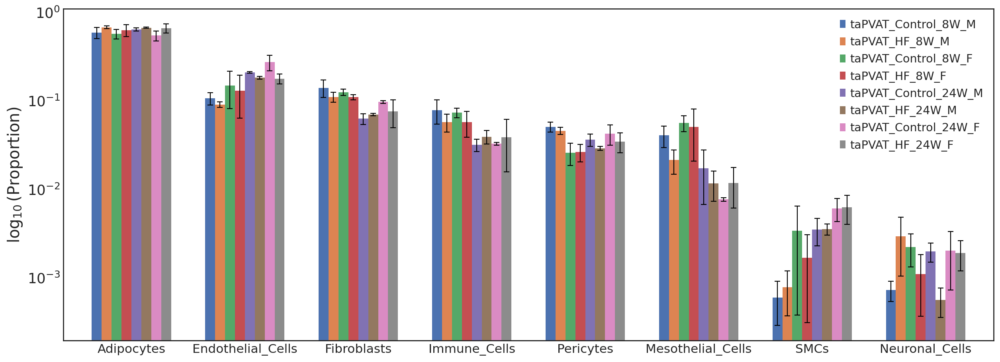

In [18]:
props_df = df
leiden_col = 'celltype'
group = 'sample_type'
group_order = ['taPVAT_Control_8W_M','taPVAT_HF_8W_M', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_F', 
               'taPVAT_Control_24W_M', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_F'
               ]

cell_type_order = ['Adipocytes',  'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells',
                   'Pericytes', 'Mesothelial_Cells',  'SMCs', 'Neuronal_Cells']


dfp = props_df.pivot(index=leiden_col, columns=group, values='mean_by_celltype')
yerr = props_df.pivot(index=leiden_col, columns=group, values='sem_by_celltype')

# Define the order of groups for plotting
dfp = dfp.reindex(index=cell_type_order)
dfp = dfp[group_order]
yerr = yerr[group_order]

### Generate the plot
plt.style.use("seaborn-white")
#sns.set_theme(style="whitegrid")
fig, ax = plt.subplots(figsize = (16,6))

# Define custom error bar properties
error_kw = {
    'capsize': 3,  # Adjust cap size
    'elinewidth': 1.0,  # Adjust error bar line width
    'ecolor': 'black'  # Set error bar color
}
### Set color palette
seaborn_palette = sns.color_palette("deep", n_colors=8)

# Convert Seaborn palette to Matplotlib colormap
cmap = ListedColormap(seaborn_palette)

g = dfp.plot(kind='bar', yerr=yerr, rot=0, ax=ax, error_kw=error_kw, width = 0.7, colormap = cmap, legend = True)

g.set(yscale='log')

#plt.title('Proportions of Each Cell Type Across Treatments', fontsize=20)  # Set title font size
plt.xlabel("", size = 22)
plt.ylabel(r'$\log_{10}(\mathrm{Proportion})$', fontsize=18)  # Set y-axis label font size
plt.xticks(fontsize=14)  # Set x-axis tick label font size
plt.legend(loc = 'upper right')

plt.savefig('../output/a_taPVAT_proportions_labeled_celltype_sampletype.png', bbox_inches = "tight", dpi = 1200)

plt.tight_layout()
plt.show()


In [9]:
### This doesn't run properly
# sns.set_theme(style="whitegrid")

# cell_type_order = ['Adipocytes',  'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells',
#        'Pericytes', 'Mesothelial_Cells',  'SMCs', 'Neuronal_Cells']

# sample_type_order = ['taPVAT_HF_24W_F', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_M', 
#                      'taPVAT_Control_24W_M','taPVAT_HF_8W_F', 'taPVAT_Control_8W_F', 
#                      'taPVAT_HF_8W_M', 'taPVAT_Control_8W_M']

# # Define custom error bar properties
# error_kw = {
#     'capsize': 5,  # Adjust cap size
#     'elinewidth': 1.5,  # Adjust error bar line width
#     'ecolor': 'black'  # Set error bar color
# }

# # Draw a nested barplot by sample_type and celltype
# g = sns.catplot(
#     data=df, kind="bar",
#     x="celltype", y="mean_by_celltype", hue="sample_type",
#      yerr='sem_by_celltype', palette="tab10", alpha=.6, height=16, aspect=3.5,
#     error_kw=error_kw,
#     legend = False,
#     order = cell_type_order,
#     hue_order = sample_type_order,
#     capsize=0.05
# )
# g.despine(left=True)
# g.set_axis_labels("", "Celltype Proportion")
# g.set(yscale='log')
# #g.legend.set_title("")

# # Set font size for various plot elements
# plt.title('Proportions of Each Cell Type Across Treatments', fontsize=64)  # Set title font size
# plt.ylabel(r'$\log_{10}(\mathrm{Proportion})$', fontsize=56)  # Set y-axis label font size
# plt.xticks(fontsize=56)  # Set x-axis tick label font size
# plt.yticks(fontsize=36)  # Set y-axis tick label font size
# plt.legend(fontsize=36)  # Set legend font size

# #plt.savefig('../output/PVAT_proportions_labeled_celltype_sampletype.png', bbox_inches = "tight")

# # Show the plot
# plt.show()

In [ ]:
###########

In [21]:
# Initialize an empty list to store DataFrames for each sample
dfs = []

# Iterate over each sample
for sample in adata.obs['sample_type'].unique():
    # Filter AnnData object for the current sample
    sample_adata = adata[adata.obs['sample_type'] == sample]

    # Calculate cell type proportions for the current sample
    cell_type_proportions = sample_adata.obs['celltype_broad'].value_counts(normalize=True).reset_index()
    cell_type_proportions.columns = [f'Cell_Type_{sample}', f'{sample}']
    cell_type_proportions.sort_values(by=f'Cell_Type_{sample}', inplace = True)
    cell_type_proportions.reset_index(drop=True, inplace=True)

    # Append the proportion data to the list of DataFrames
    dfs.append(cell_type_proportions)

# Concatenate the list of DataFrames into a single DataFrame
proportions_df = pd.concat(dfs, axis=1)

# proportions_df.drop(proportions_df.columns[[2,4,6,8,10,12,14]], axis=1, inplace=True)
#proportions_df.rename(columns = {'Cell_Type_taPVAT_Control_8W_M':'Cell_Type'}, inplace = True)

# Display the DataFrame
proportions_df


,Cell_Type_taPVAT_Control_8W_M,taPVAT_Control_8W_M,Cell_Type_taPVAT_HF_8W_M,taPVAT_HF_8W_M,Cell_Type_taPVAT_Control_24W_M,taPVAT_Control_24W_M,Cell_Type_taPVAT_HF_24W_M,taPVAT_HF_24W_M,Cell_Type_taPVAT_Control_24W_F,taPVAT_Control_24W_F,Cell_Type_taPVAT_Control_8W_F,taPVAT_Control_8W_F,Cell_Type_taPVAT_HF_24W_F,taPVAT_HF_24W_F,Cell_Type_taPVAT_HF_8W_F,taPVAT_HF_8W_F
0,Adipocytes,0.607051,Adipocytes,0.669130,Adipocytes,0.654622,Adipocytes,0.666716,Adipocytes,0.582294,Adipocytes,0.600095,Adipocytes,0.635606,Adipocytes,0.663862
1,Endothelial_Cells,0.100633,Endothelial_Cells,0.091174,Endothelial_Cells,0.211399,Endothelial_Cells,0.180127,Endothelial_Cells,0.237590,Endothelial_Cells,0.112449,Endothelial_Cells,0.199155,Endothelial_Cells,0.105672
2,Fibroblasts,0.134862,Fibroblasts,0.112094,Fibroblasts,0.057607,Fibroblasts,0.069481,Fibroblasts,0.097558,Fibroblasts,0.126386,Fibroblasts,0.084497,Fibroblasts,0.106655
3,Immune_Cells,0.070683,Immune_Cells,0.060054,Immune_Cells,0.028280,Immune_Cells,0.039522,Immune_Cells,0.031723,Immune_Cells,0.077764,Immune_Cells,0.028283,Immune_Cells,0.057808
4,Mesothelial_Cells,0.036283,Mesothelial_Cells,0.020087,Mesothelial_Cells,0.010910,Mesothelial_Cells,0.011356,Mesothelial_Cells,0.007433,Mesothelial_Cells,0.050839,Mesothelial_Cells,0.013144,Mesothelial_Cells,0.040979
5,Neuronal_Cells,0.000685,Neuronal_Cells,0.002290,Neuronal_Cells,0.001658,Neuronal_Cells,0.000598,Neuronal_Cells,0.001460,Neuronal_Cells,0.002217,Neuronal_Cells,0.002699,Neuronal_Cells,0.000765
6,Pericytes,0.049290,Pericytes,0.044338,Pericytes,0.032818,Pericytes,0.028689,Pericytes,0.036236,Pericytes,0.028508,Pericytes,0.032977,Pericytes,0.023058
7,SMCs,0.000513,SMCs,0.000833,SMCs,0.002706,SMCs,0.003511,SMCs,0.005707,SMCs,0.001742,SMCs,0.003638,SMCs,0.001202


In [22]:
proportions_df_transposed = proportions_df.T

proportions_df_transposed.columns = proportions_df_transposed.iloc[0]
proportions_df_transposed = proportions_df_transposed.iloc[1:]

# Reset index and rename the index column
proportions_df_transposed.reset_index(inplace=True)
proportions_df_transposed.rename(columns={'index': 'Sample_Ids'}, inplace=True)

plotting_order = ['taPVAT_HF_24W_F', 'taPVAT_Control_24W_F', 'taPVAT_HF_24W_M', 'taPVAT_Control_24W_M', 
                  'taPVAT_HF_8W_F', 'taPVAT_Control_8W_F', 'taPVAT_HF_8W_M', 'taPVAT_Control_8W_M'
                  ]
df = proportions_df_transposed.set_index('Sample_Ids').loc[plotting_order].reset_index()
df

Cell_Type_taPVAT_Control_8W_M,Sample_Ids,Adipocytes,Endothelial_Cells,Fibroblasts,Immune_Cells,Mesothelial_Cells,Neuronal_Cells,Pericytes,SMCs
0,taPVAT_HF_24W_F,0.635606,0.199155,0.084497,0.028283,0.013144,0.002699,0.032977,0.003638
1,taPVAT_Control_24W_F,0.582294,0.23759,0.097558,0.031723,0.007433,0.00146,0.036236,0.005707
2,taPVAT_HF_24W_M,0.666716,0.180127,0.069481,0.039522,0.011356,0.000598,0.028689,0.003511
3,taPVAT_Control_24W_M,0.654622,0.211399,0.057607,0.02828,0.01091,0.001658,0.032818,0.002706
4,taPVAT_HF_8W_F,0.663862,0.105672,0.106655,0.057808,0.040979,0.000765,0.023058,0.001202
5,taPVAT_Control_8W_F,0.600095,0.112449,0.126386,0.077764,0.050839,0.002217,0.028508,0.001742
6,taPVAT_HF_8W_M,0.66913,0.091174,0.112094,0.060054,0.020087,0.00229,0.044338,0.000833
7,taPVAT_Control_8W_M,0.607051,0.100633,0.134862,0.070683,0.036283,0.000685,0.04929,0.000513


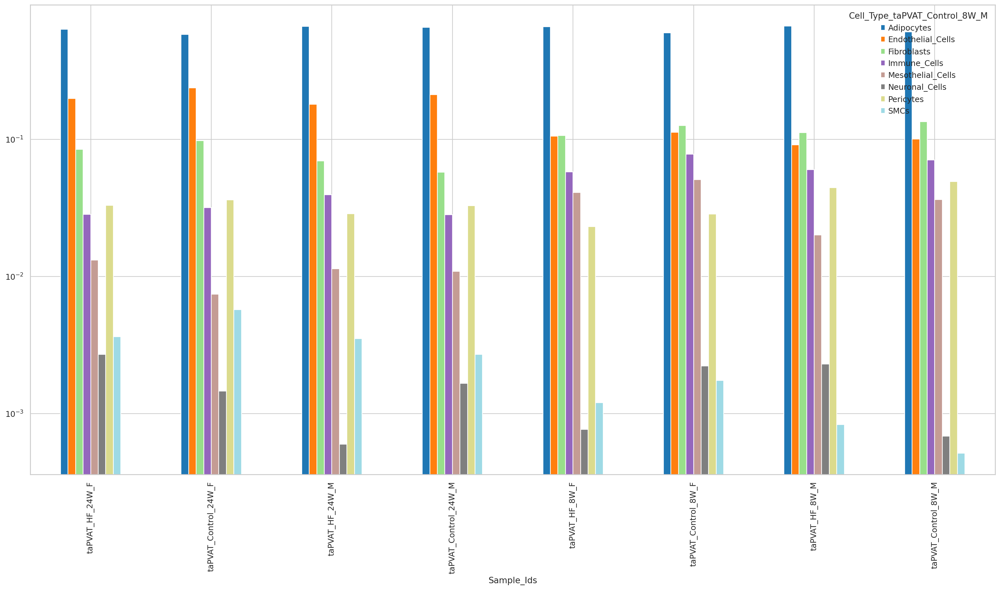

In [23]:
ax = df.plot( 
      x = 'Sample_Ids',  
      kind = 'bar',  
      stacked = False,
      mark_right = True,
      figsize = (24,12),
      color = color) 

ax.set_yscale('log')

plt.show()


In [50]:
list = ['Sample_Ids', 'Adipocytes', 'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells', 'Pericytes', 'Mesothelial_Cells', 'SMCs',  'Neuronal_Cells']
df = df[list]
df

Cell_Type_taPVAT_Control_8W_M,Sample_Ids,Adipocytes,Endothelial_Cells,Fibroblasts,Immune_Cells,Pericytes,Mesothelial_Cells,SMCs,Neuronal_Cells
0,taPVAT_HF_24W_F,0.635606,0.199155,0.084497,0.028283,0.032977,0.013144,0.003638,0.002699
1,taPVAT_Control_24W_F,0.582294,0.23759,0.097558,0.031723,0.036236,0.007433,0.005707,0.00146
2,taPVAT_HF_24W_M,0.666716,0.180127,0.069481,0.039522,0.028689,0.011356,0.003511,0.000598
3,taPVAT_Control_24W_M,0.654622,0.211399,0.057607,0.02828,0.032818,0.01091,0.002706,0.001658
4,taPVAT_HF_8W_F,0.663862,0.105672,0.106655,0.057808,0.023058,0.040979,0.001202,0.000765
5,taPVAT_Control_8W_F,0.600095,0.112449,0.126386,0.077764,0.028508,0.050839,0.001742,0.002217
6,taPVAT_HF_8W_M,0.66913,0.091174,0.112094,0.060054,0.044338,0.020087,0.000833,0.00229
7,taPVAT_Control_8W_M,0.607051,0.100633,0.134862,0.070683,0.04929,0.036283,0.000513,0.000685


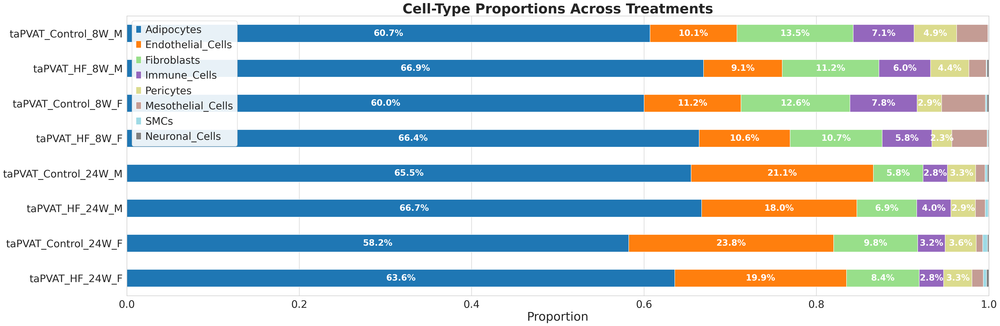

In [73]:
list = ['Sample_Ids', 'Adipocytes', 'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells', 'Pericytes', 'Mesothelial_Cells', 'SMCs',  'Neuronal_Cells']
df = df[list]

df.plot( 
      x = 'Sample_Ids',  
      kind = 'barh',  
      stacked = True,
      mark_right = True,
      figsize = (36,12),
      color = color) 

## Uncomment to include percentages displayed on graph
df_total = 0

for celltype in df.columns[1:]:
    df_total += df[celltype]
   
df_rel = df[df.columns[1:]].div(df_total, 0)*100
  
for n in df_rel.iloc[:, 0:5]: 
    for i, (cs, ab, pc) in enumerate(zip(df.iloc[:, 1:6].cumsum(1)[n],  
                                         df[n], df_rel[n])): 
            plt.text(cs - ab / 2, i, str(np.round(pc, 1)) + '%',  
                     va = 'center', ha = 'center', fontsize = 20, weight = 'bold', color = 'white')
###
plt.title('Cell-Type Proportions Across Treatments', fontsize=32, fontweight = 'bold')  # Set title font size
plt.xticks(size = 24)
plt.yticks(size = 24)
plt.ylabel("", size = 24)
plt.xlabel("Proportion", size = 28)
#plt.legend(fontsize = 28, loc='center left', bbox_to_anchor=(1, 0.5))
plt.legend(fontsize=24, loc='upper left', bbox_to_anchor=(0, 1), frameon=True, framealpha=0.9)
plt.xlim(0,1)
        
plt.show()

## Proportion differences between diet, time, and sex across high and low level cell types

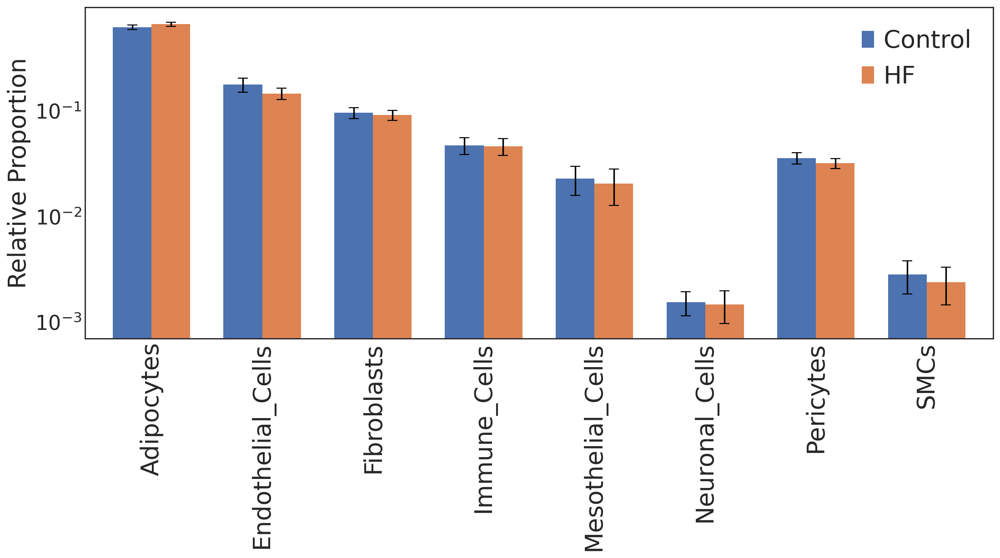

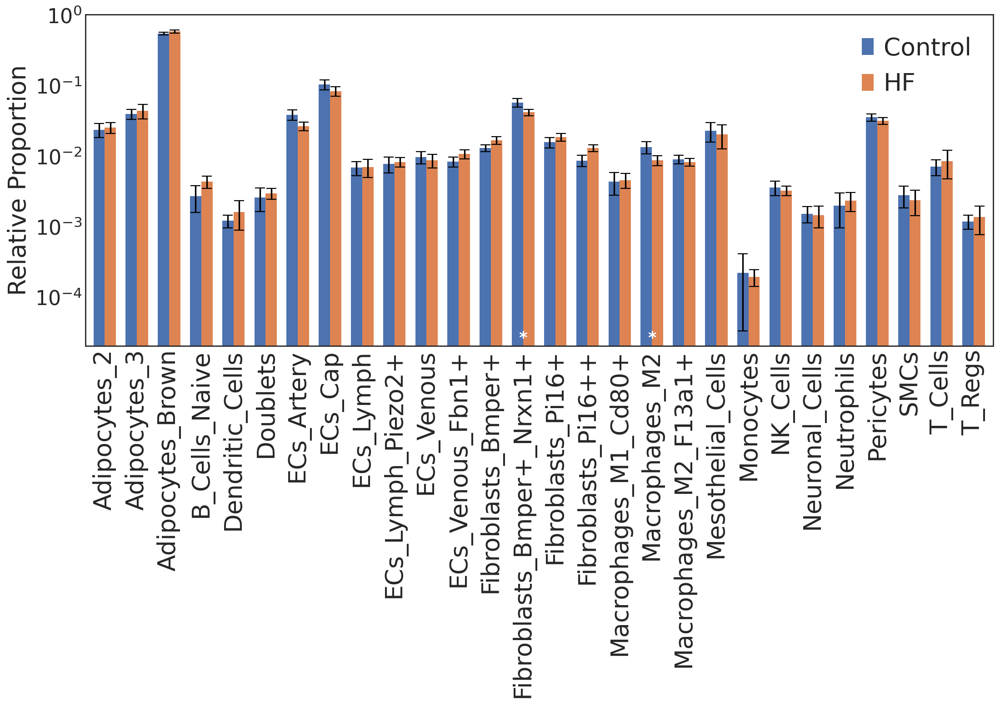

In [8]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

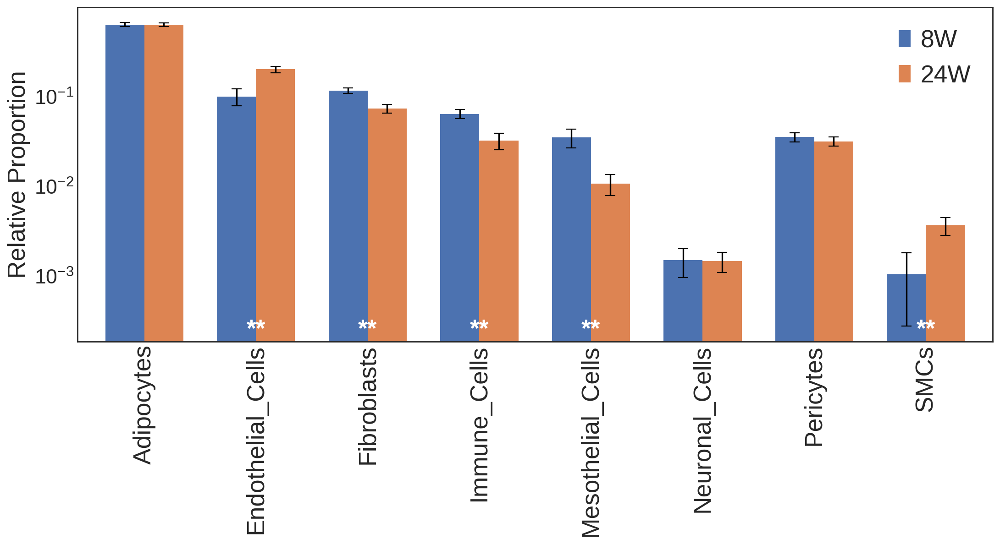

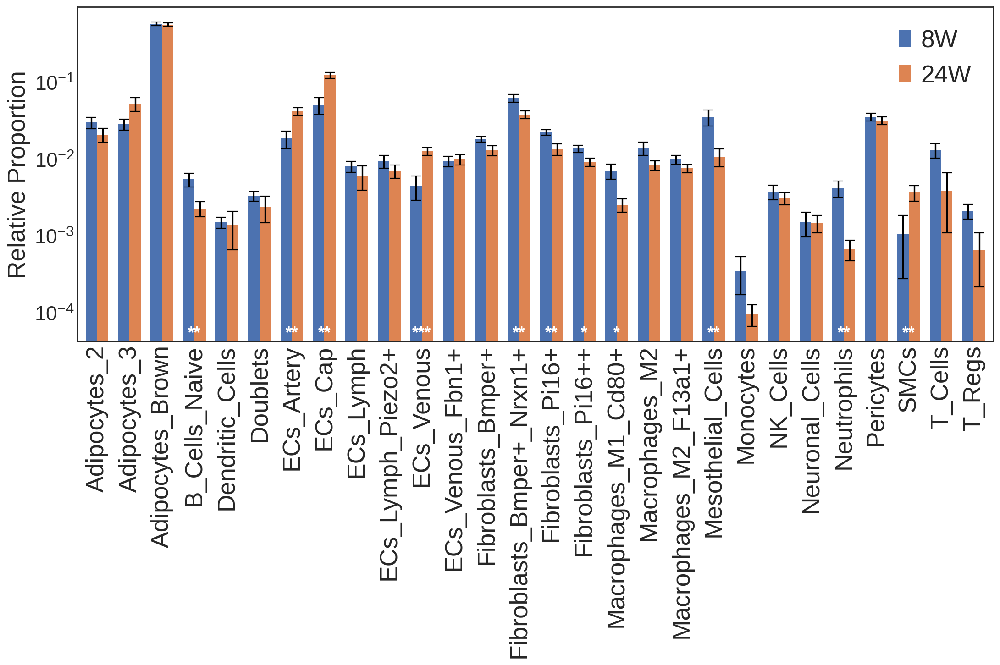

In [56]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

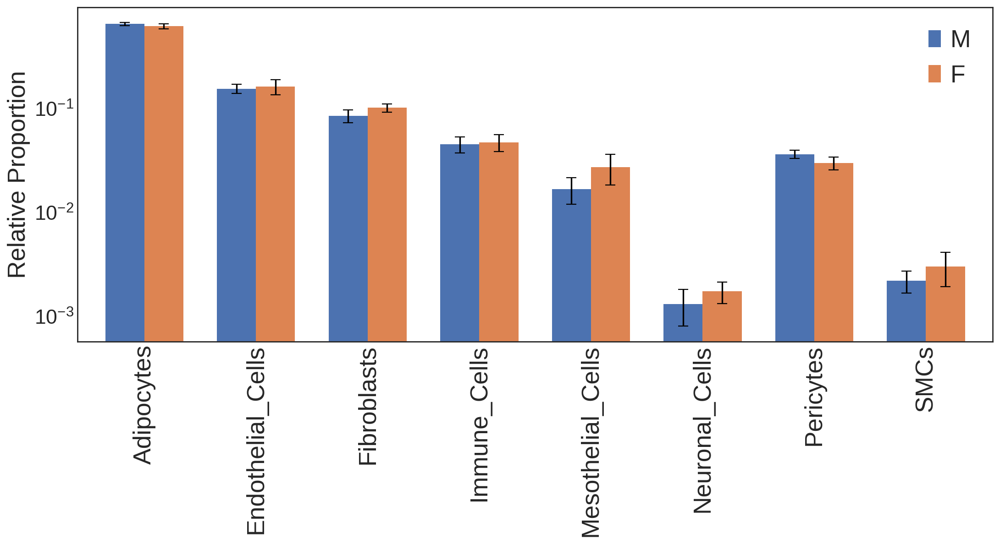

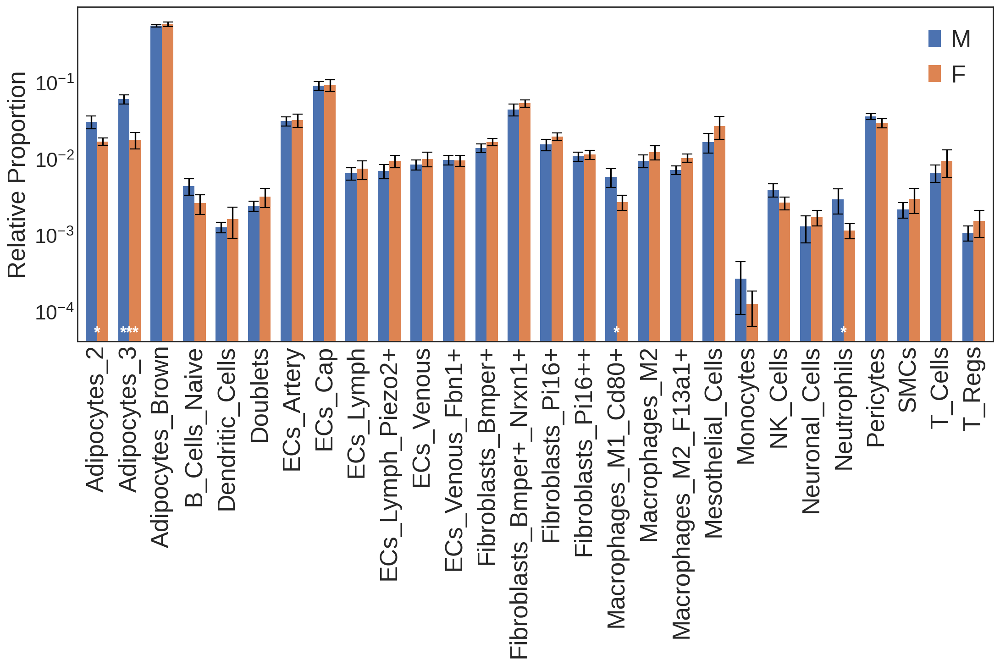

In [57]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata, 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

### Comparing across mid-level groups

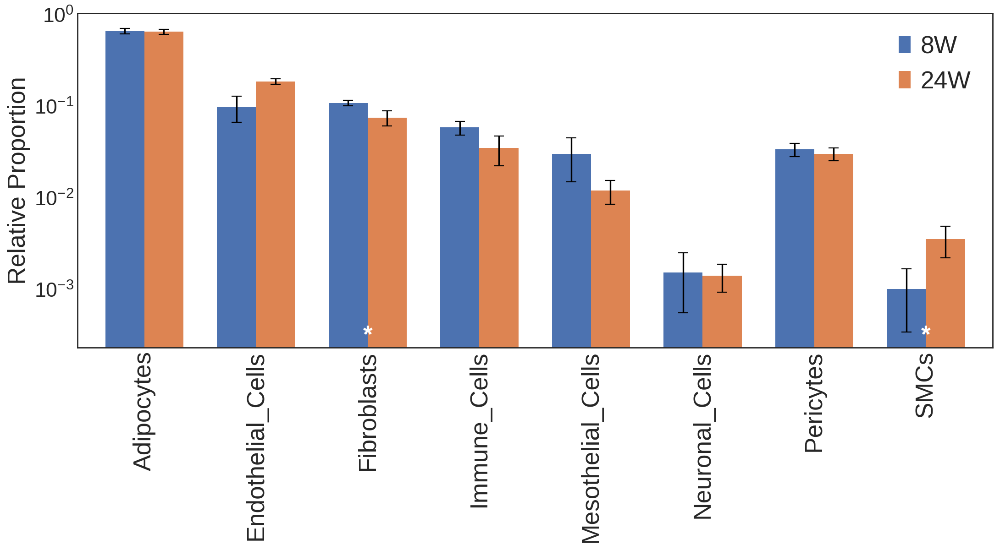

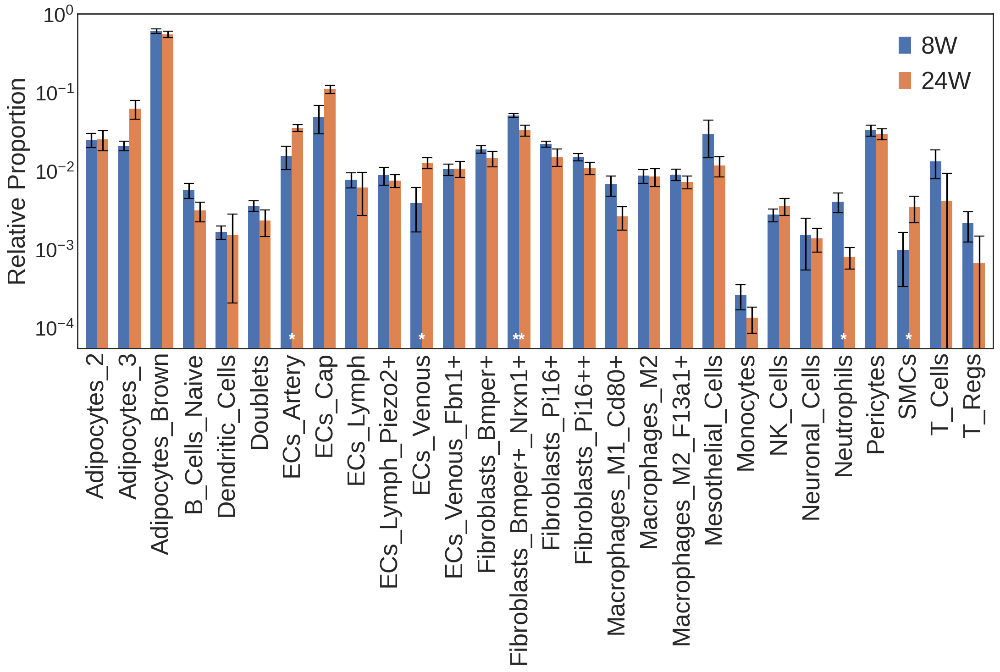

In [58]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

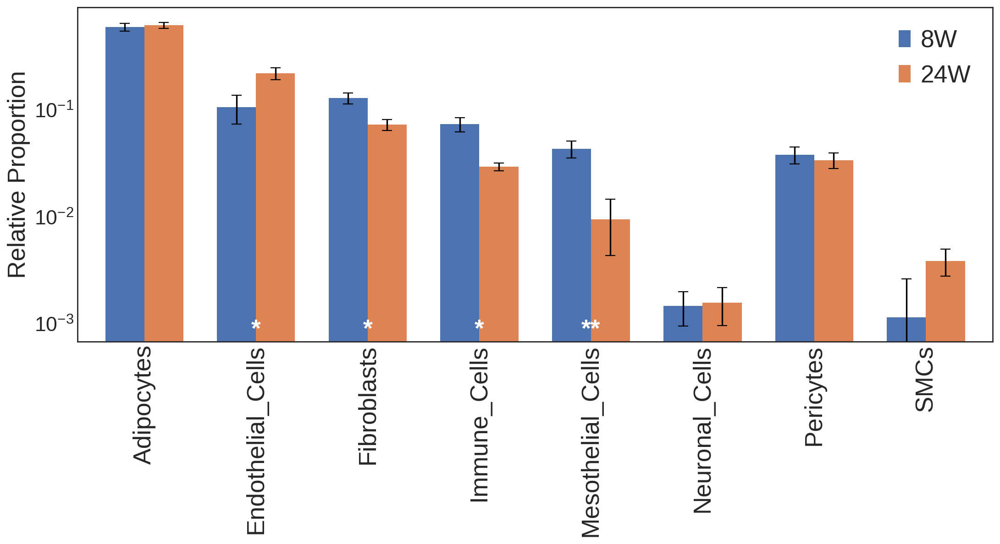

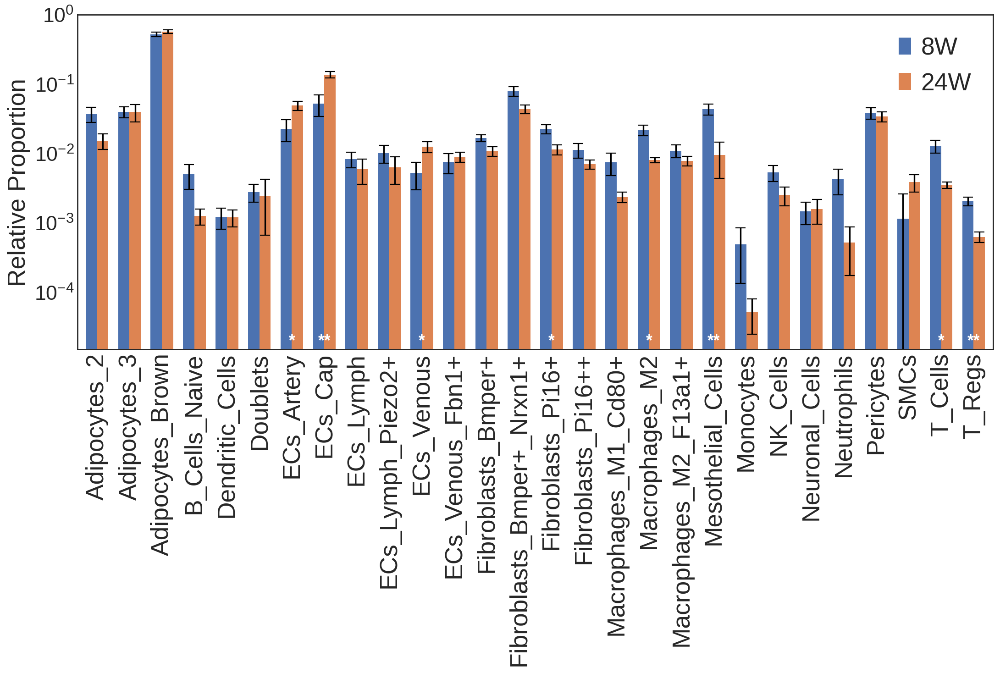

In [59]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

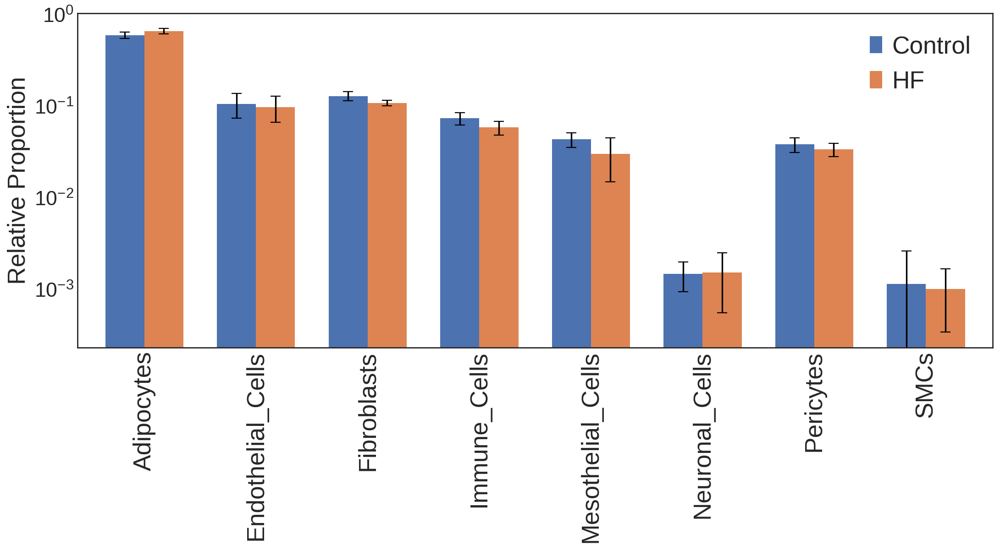

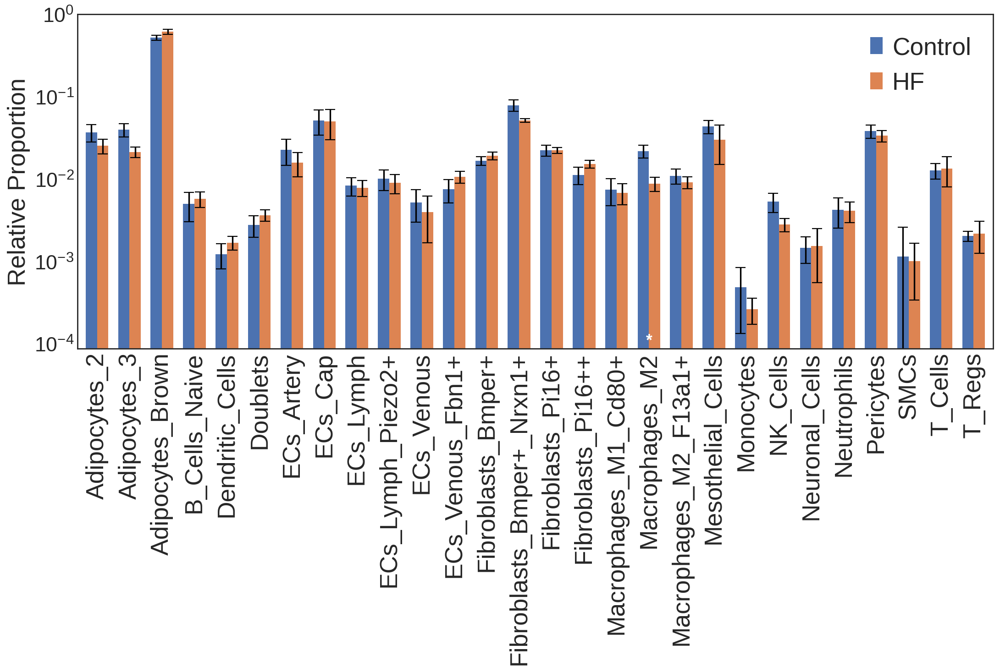

In [60]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

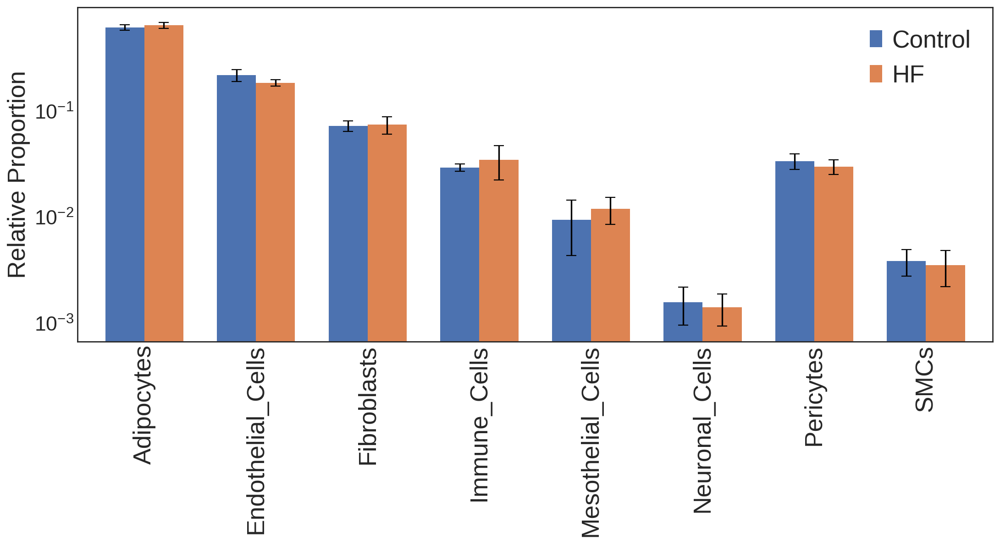

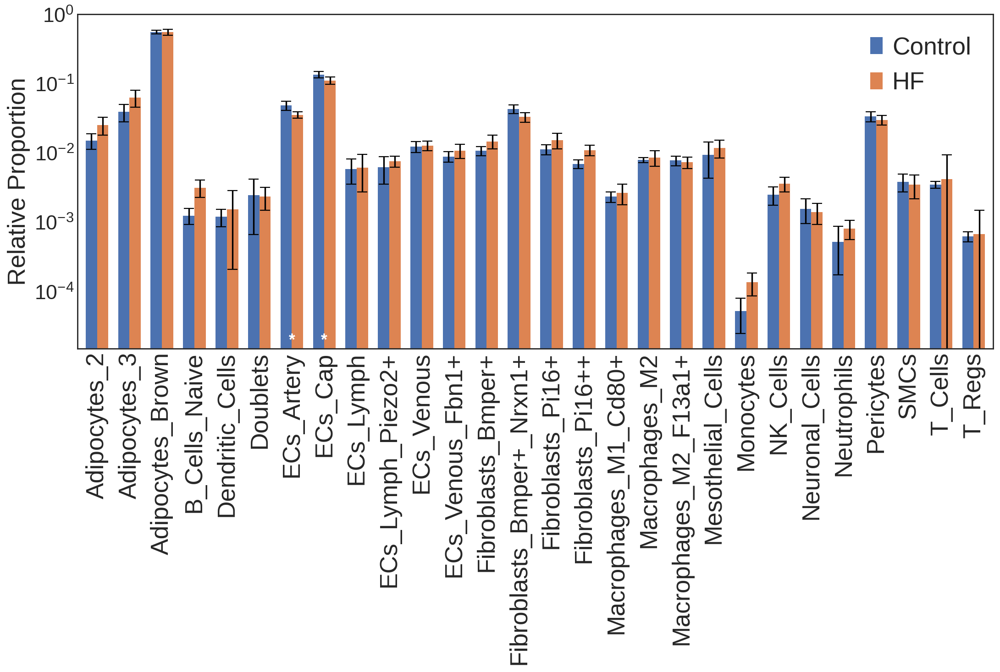

In [61]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

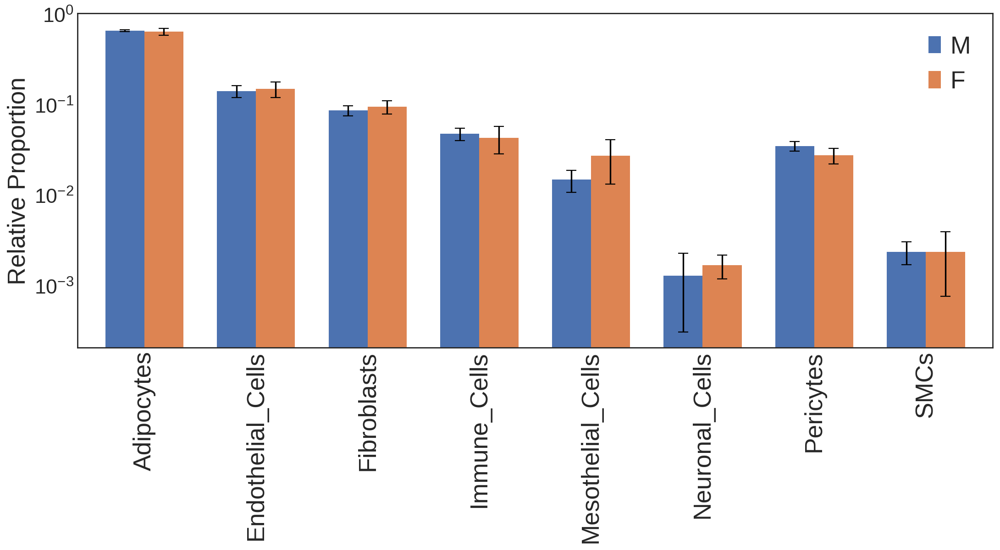

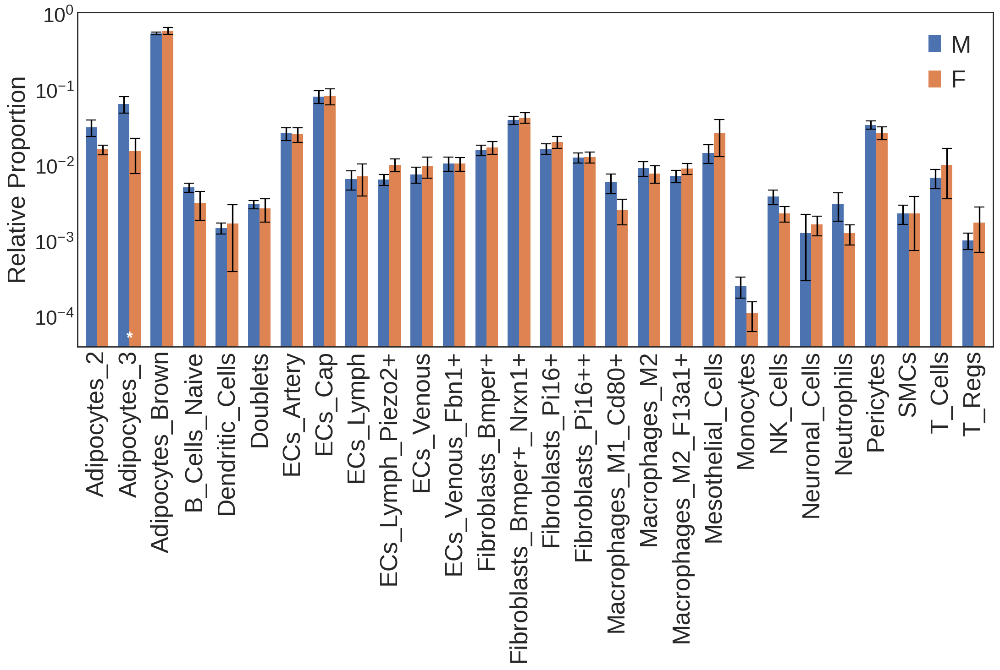

In [62]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'HF'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

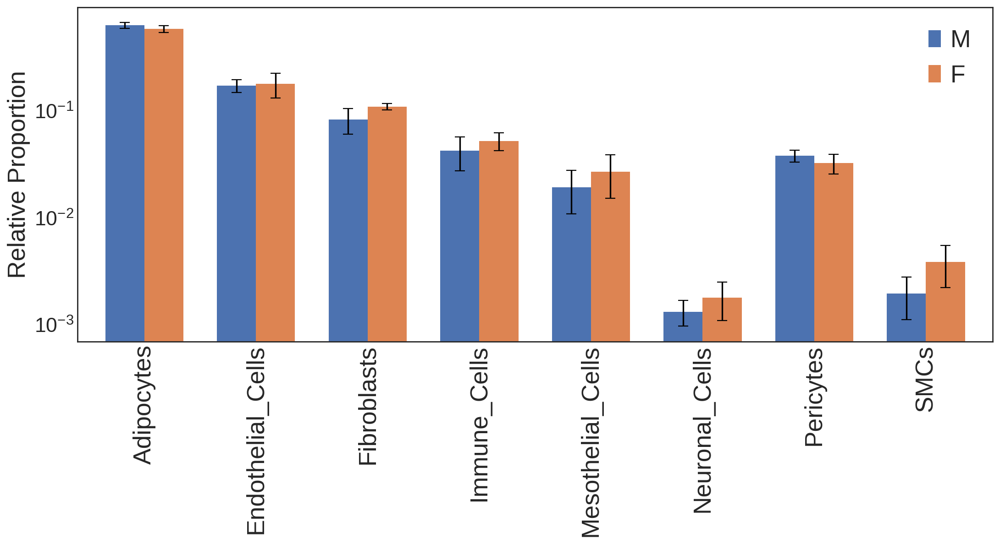

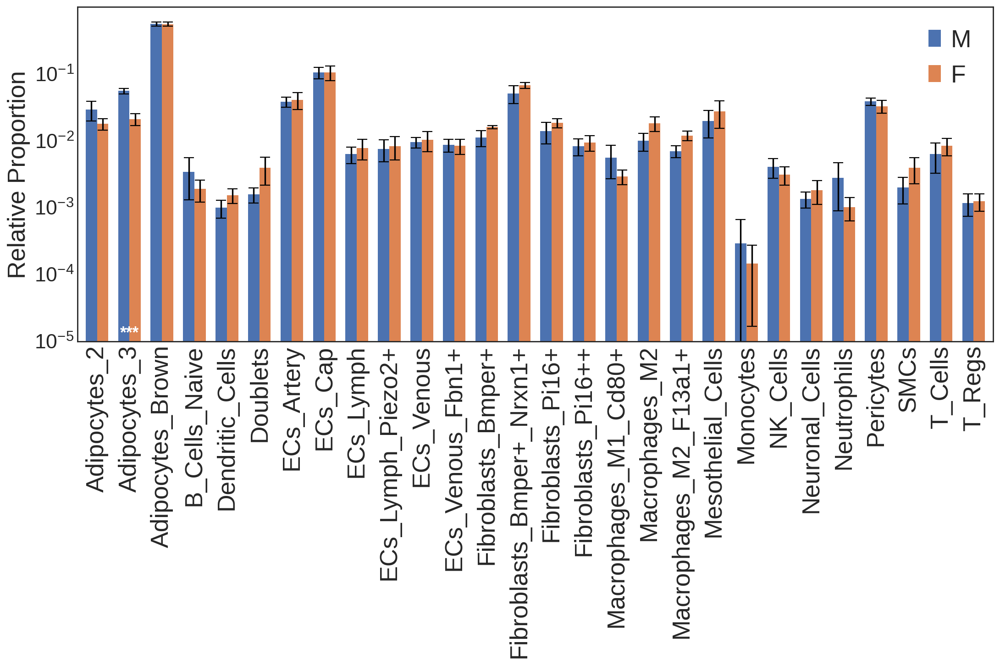

In [63]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.diet == 'Control'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

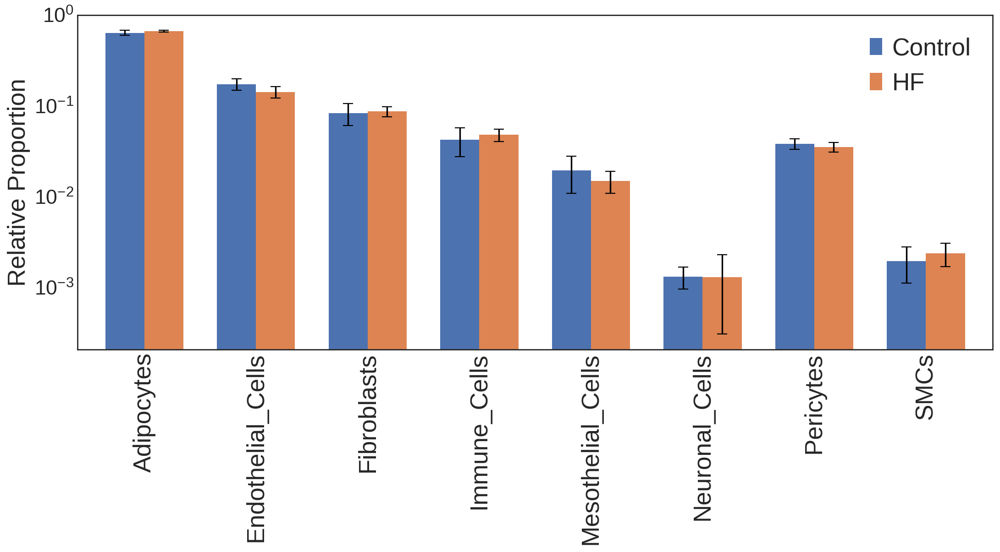

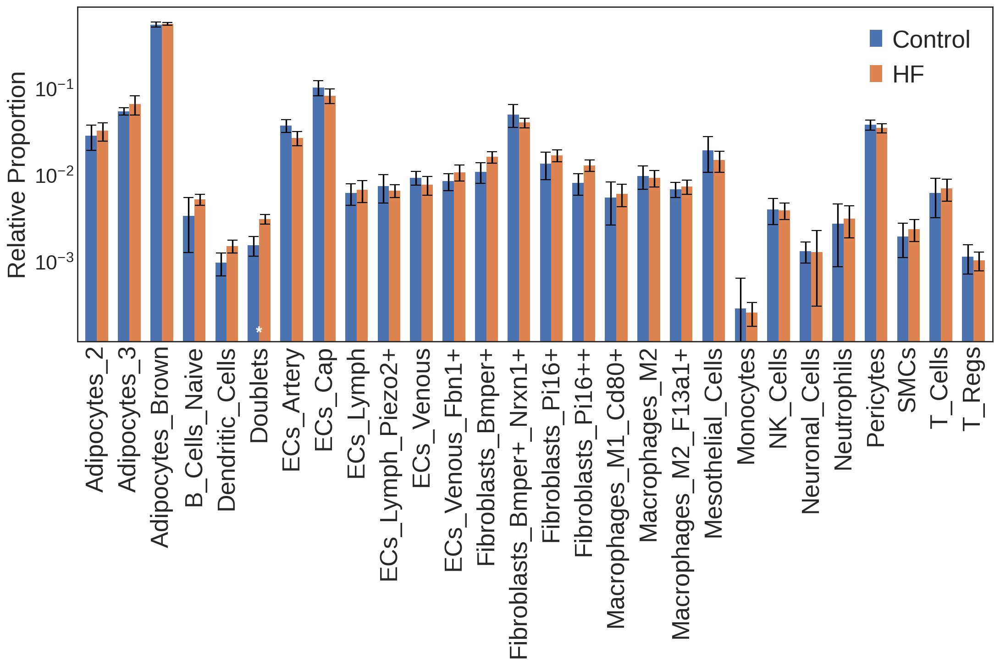

In [64]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

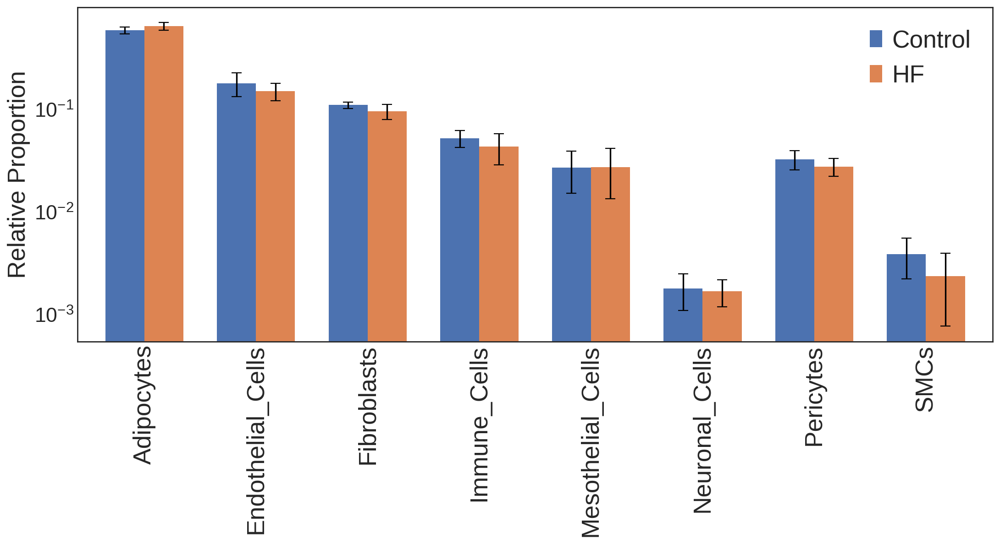

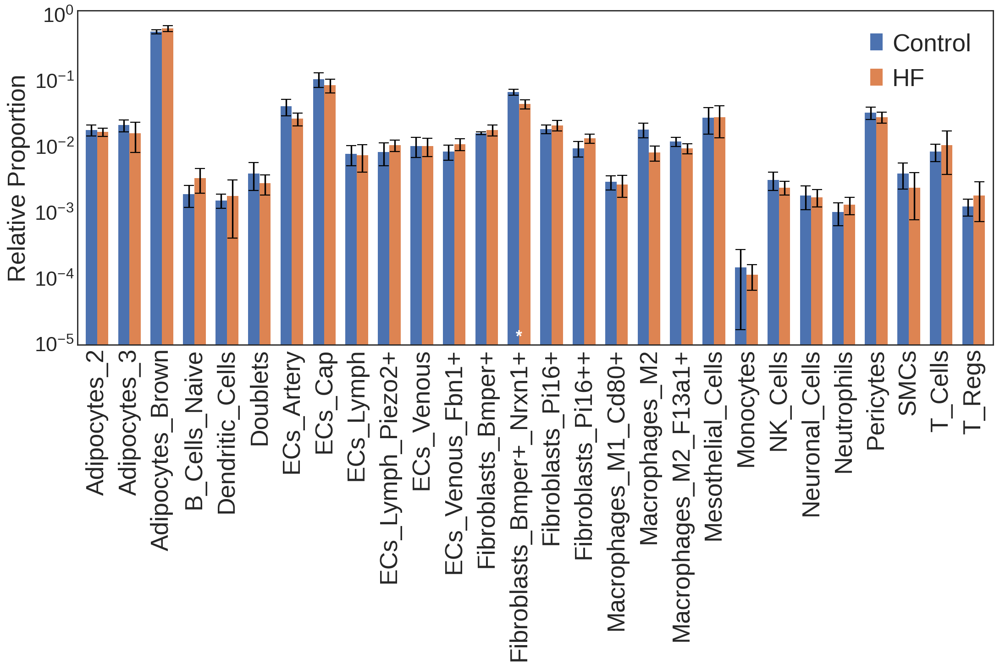

In [65]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

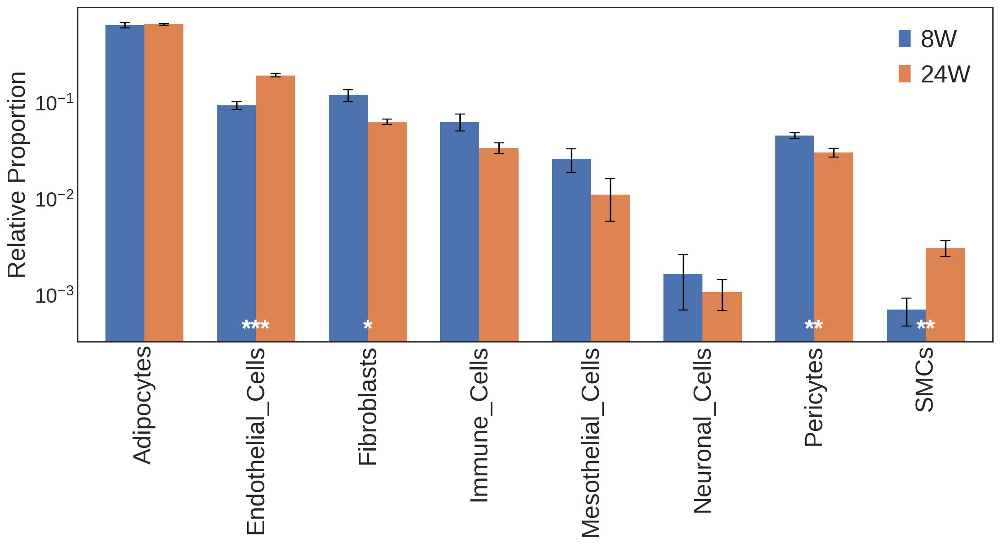

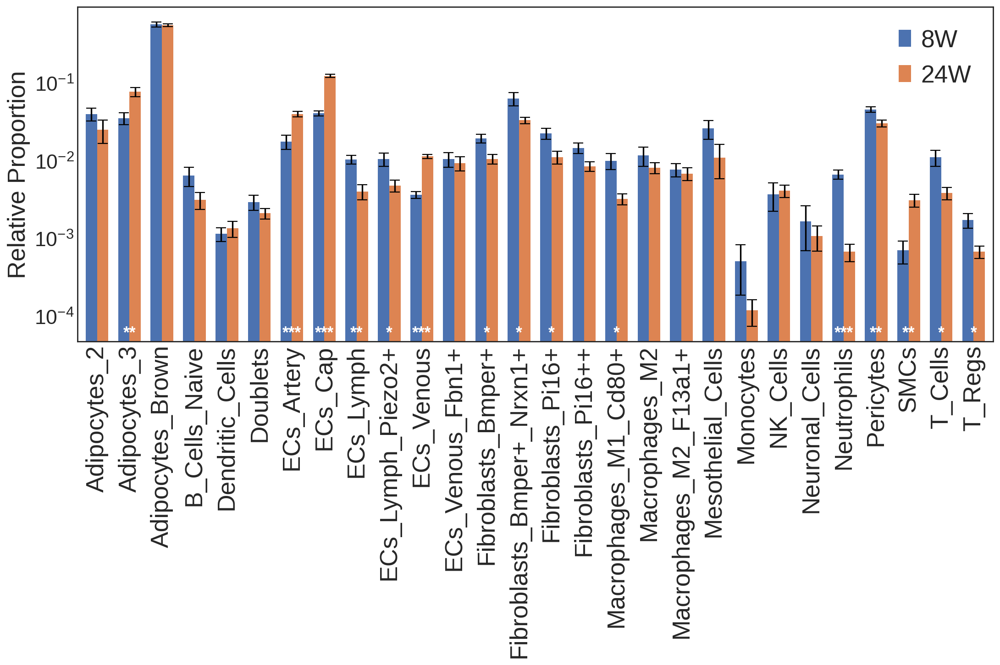

In [66]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'M'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

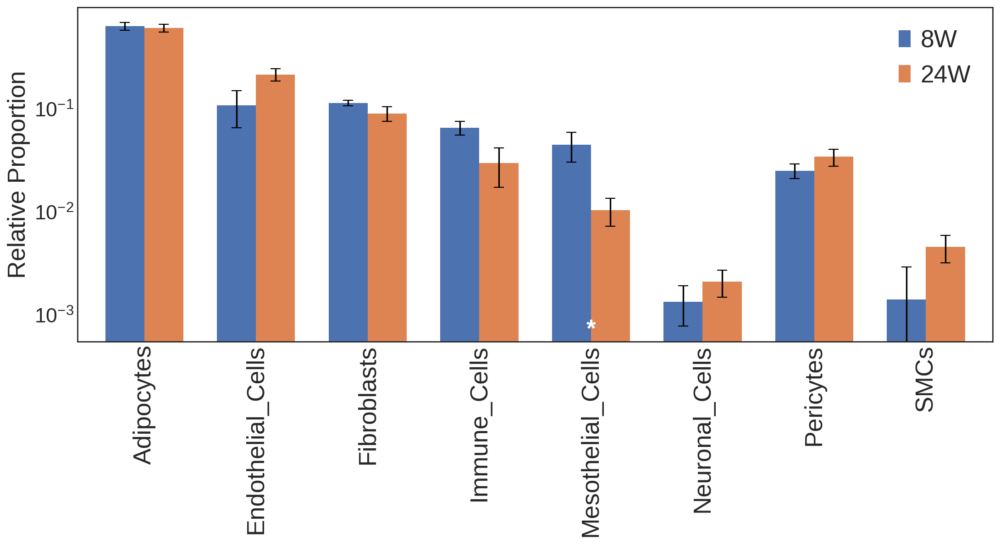

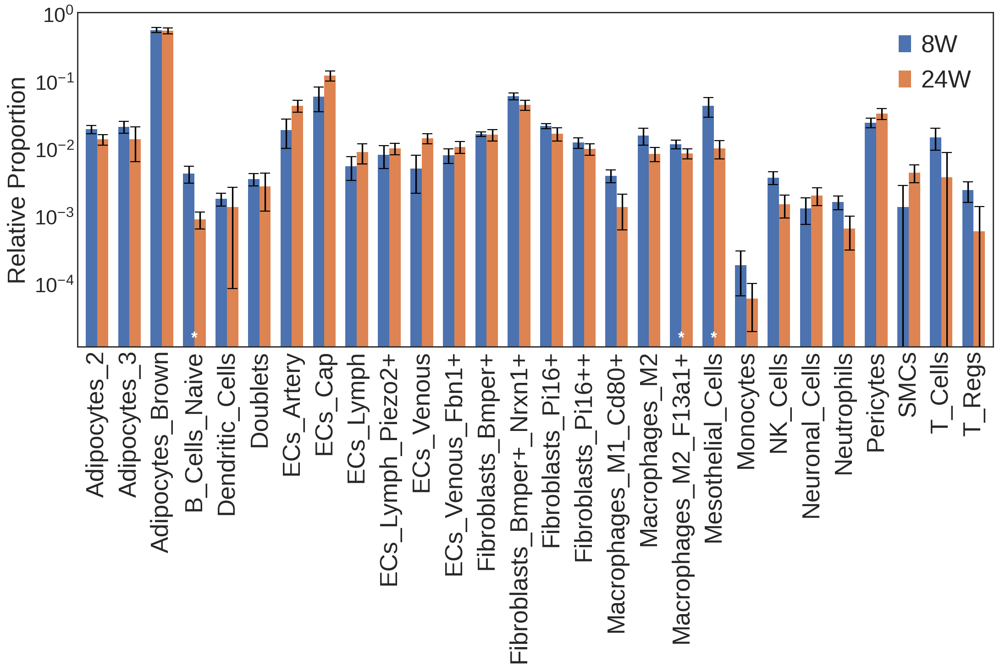

In [67]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.sex == 'F'], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

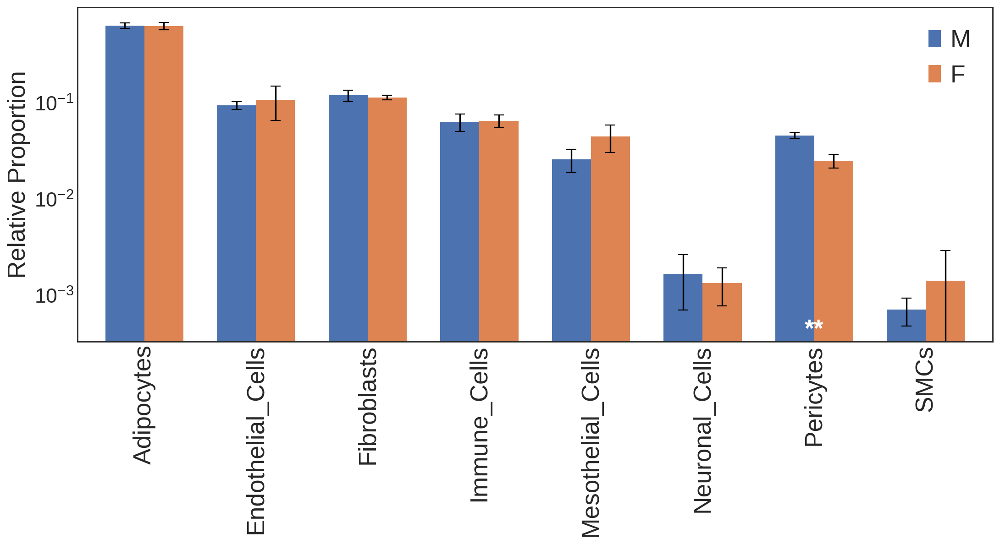

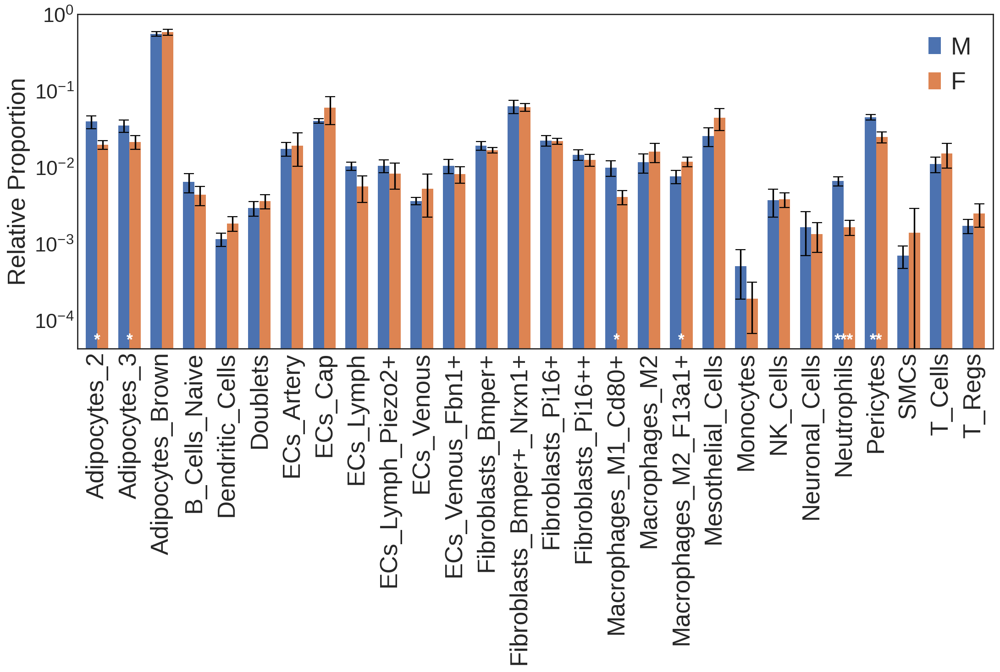

In [68]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '8W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

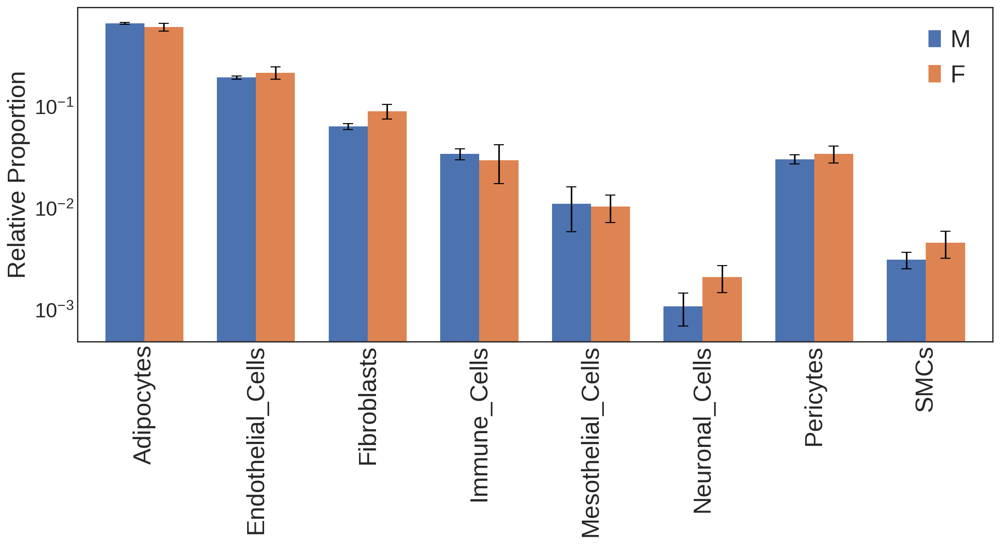

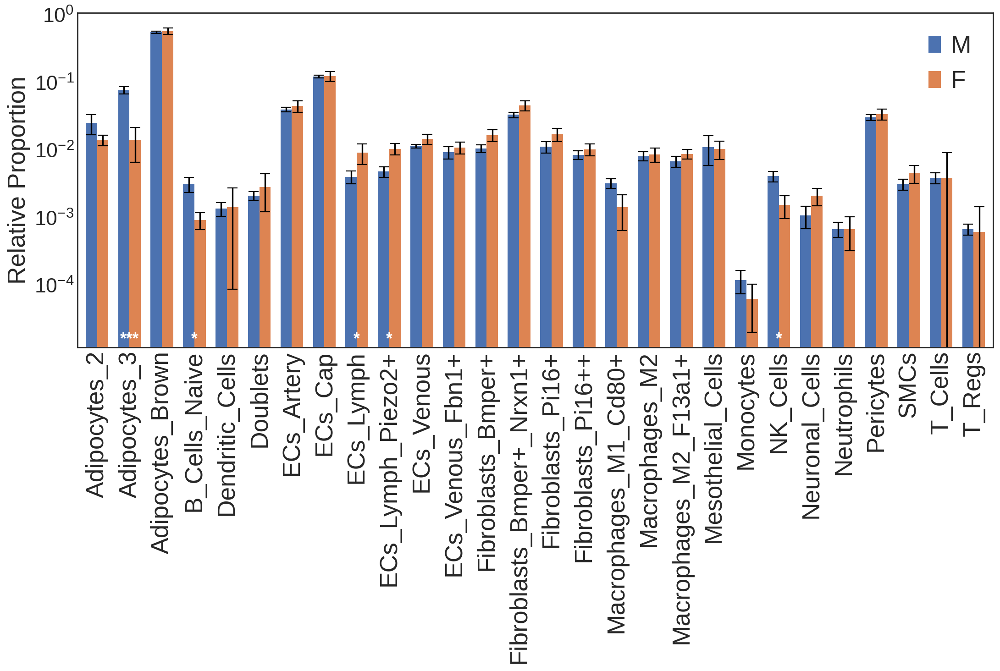

In [69]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[adata.obs.time == '24W'], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

### Comparing across low-level groups

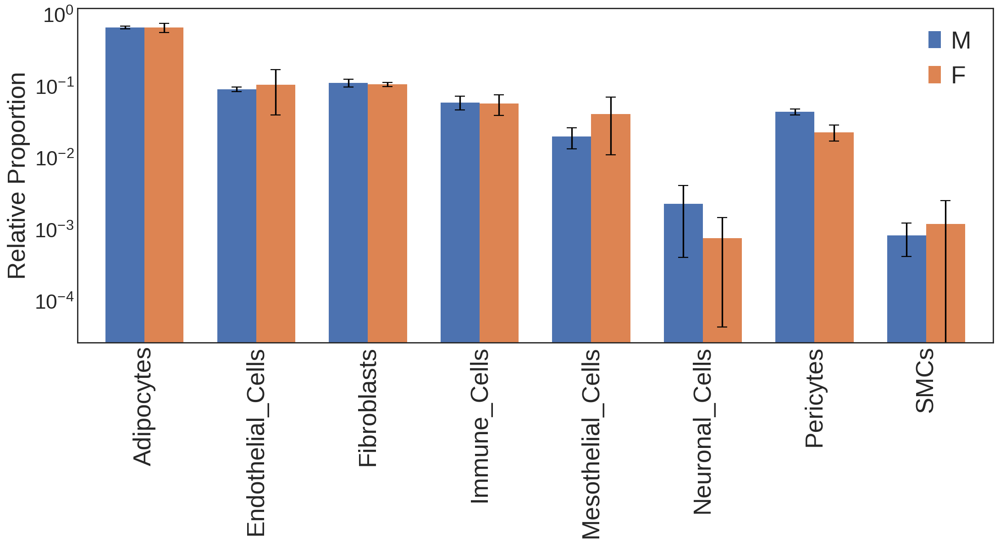

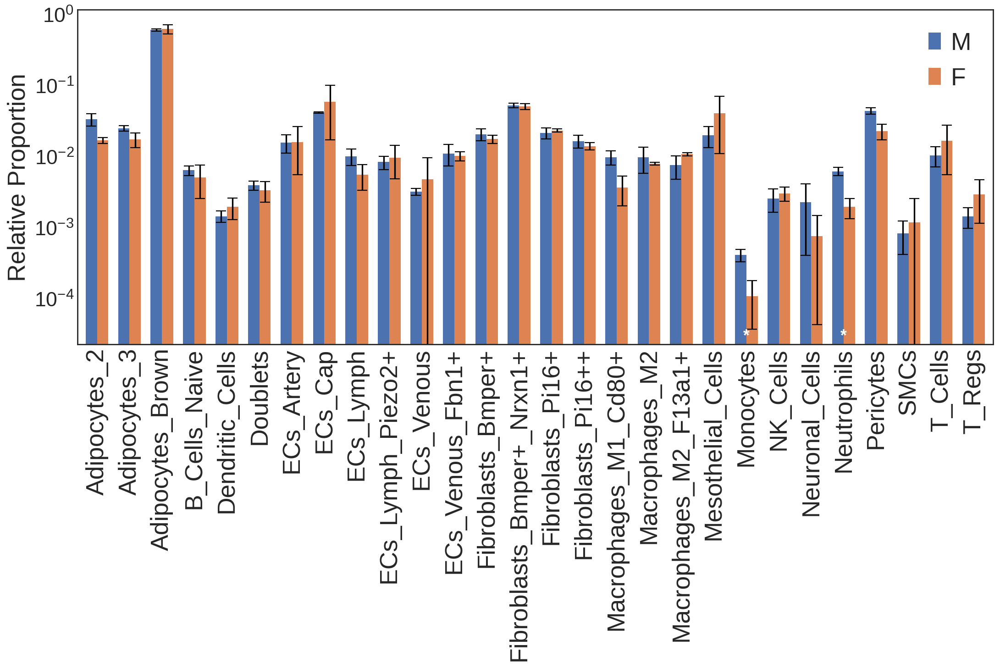

In [70]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

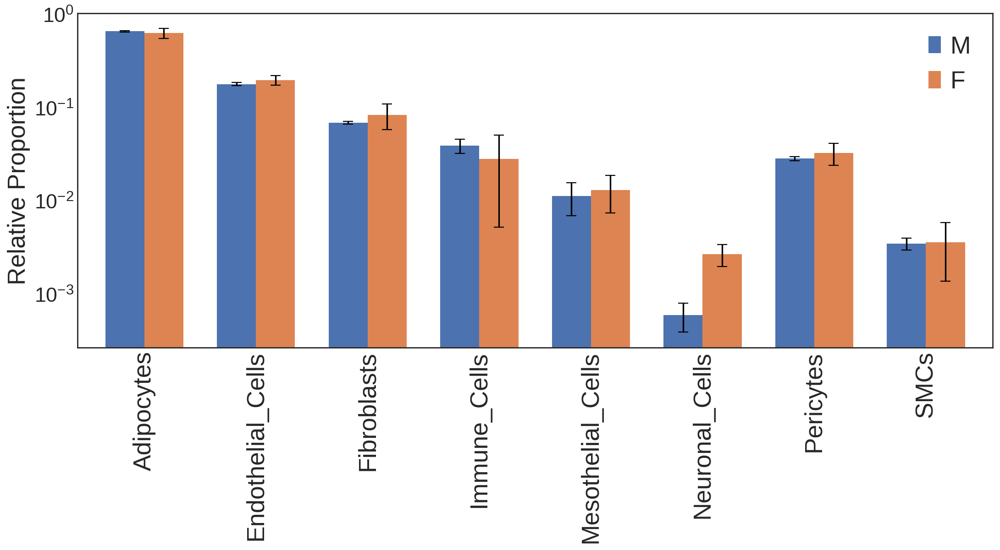

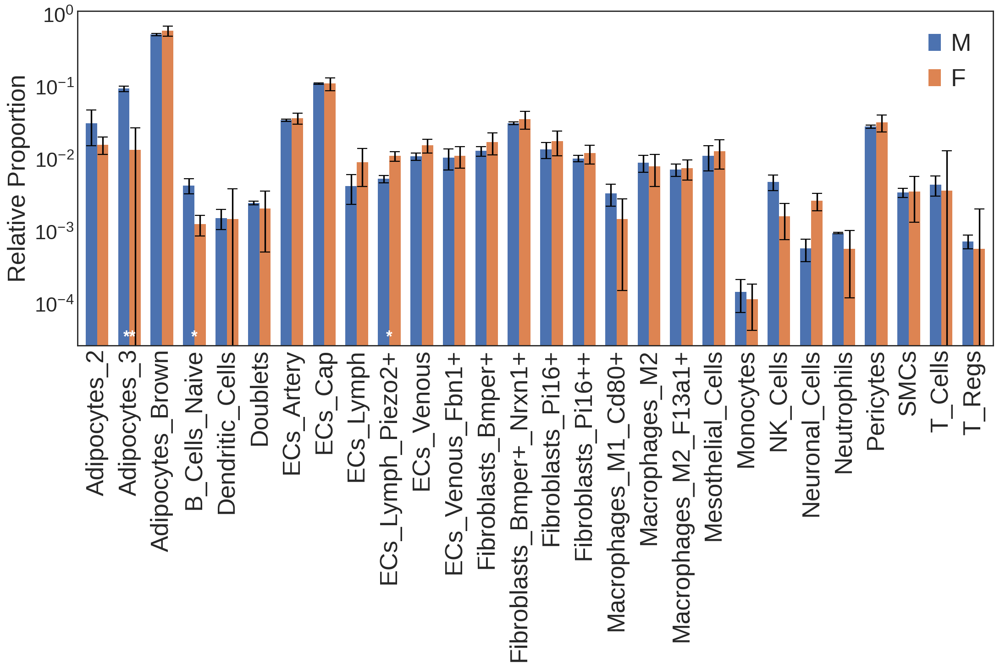

In [71]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'HF')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

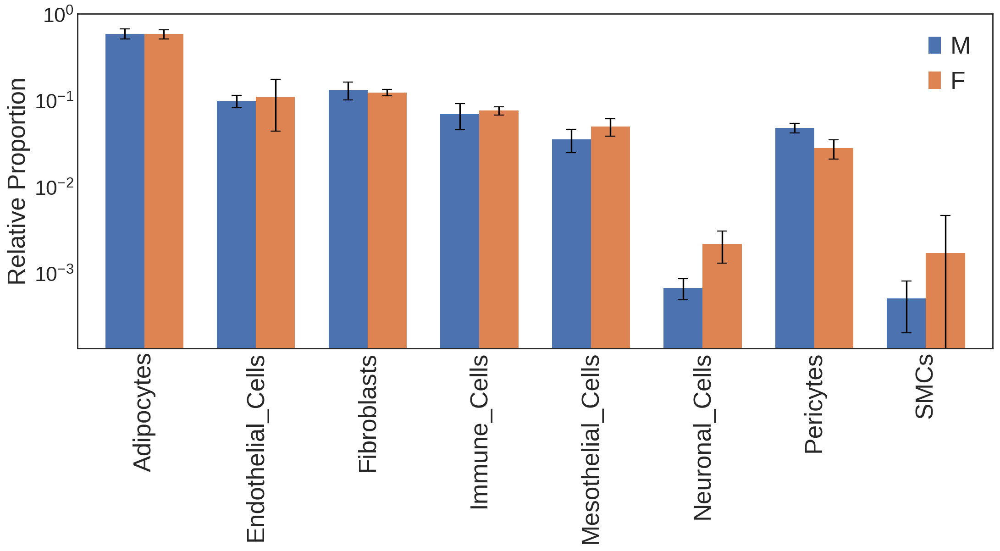

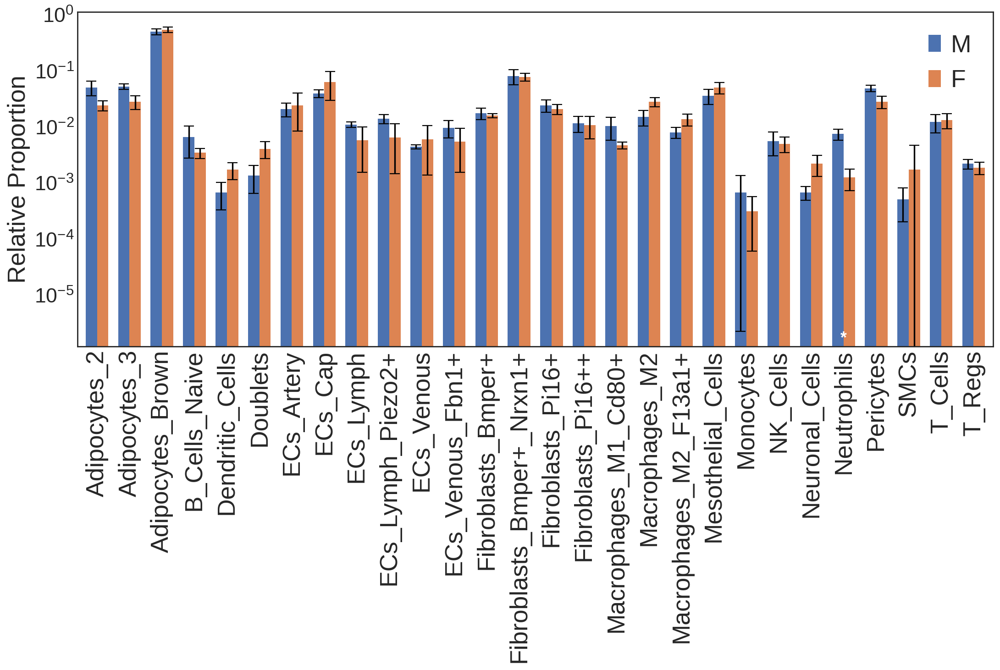

In [72]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '8W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

group2 does not contain Monocytes


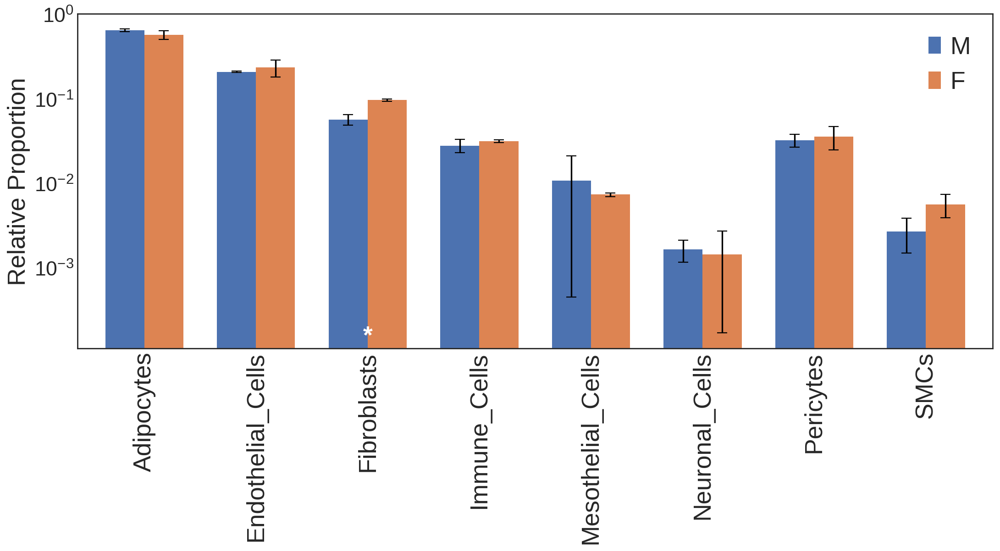

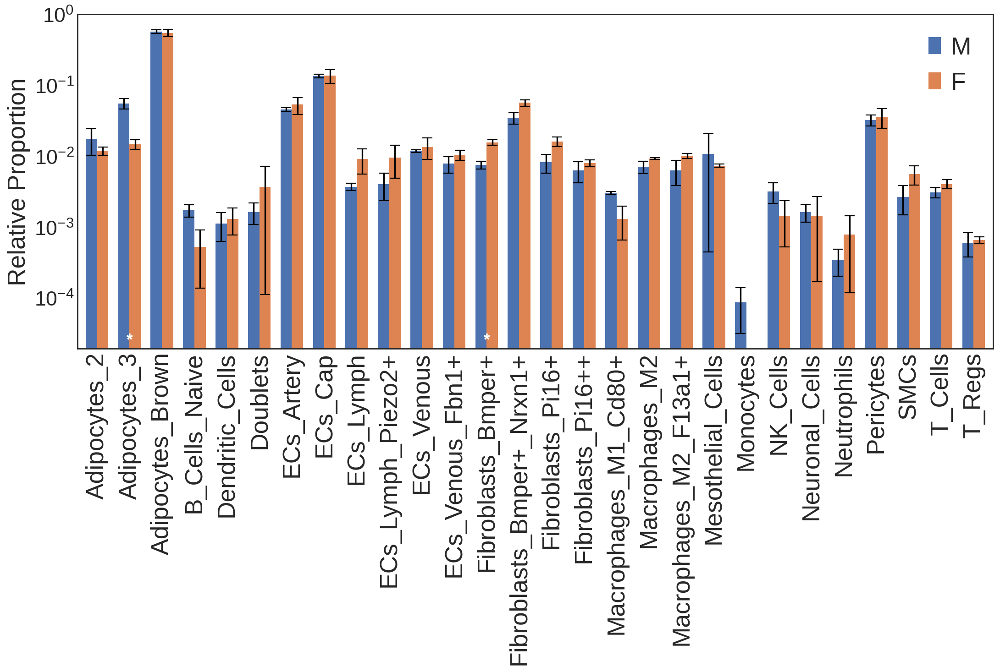

In [88]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.time == '24W') & (adata.obs.diet == 'Control')], 
                group = 'sex', 
                group1 = 'M', 
                group2 = 'F', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

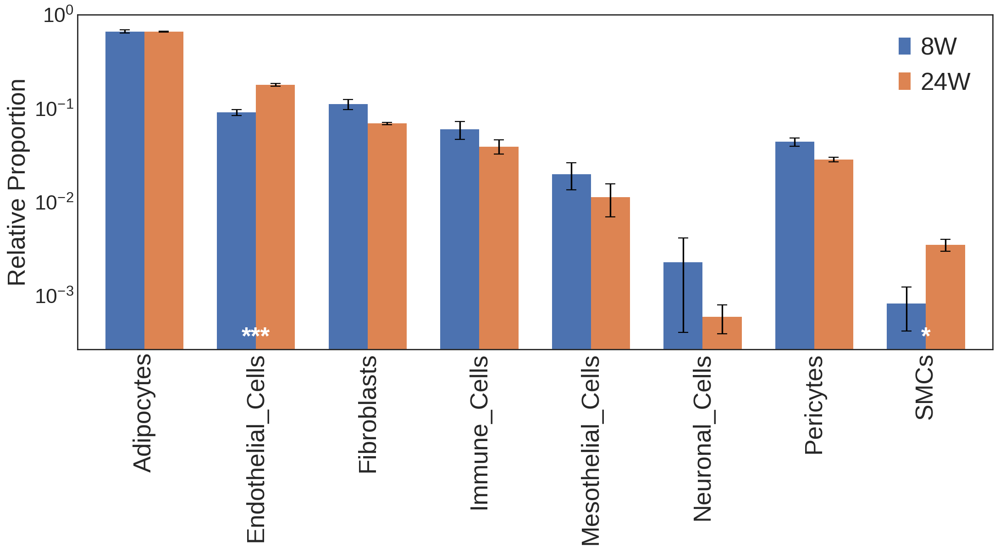

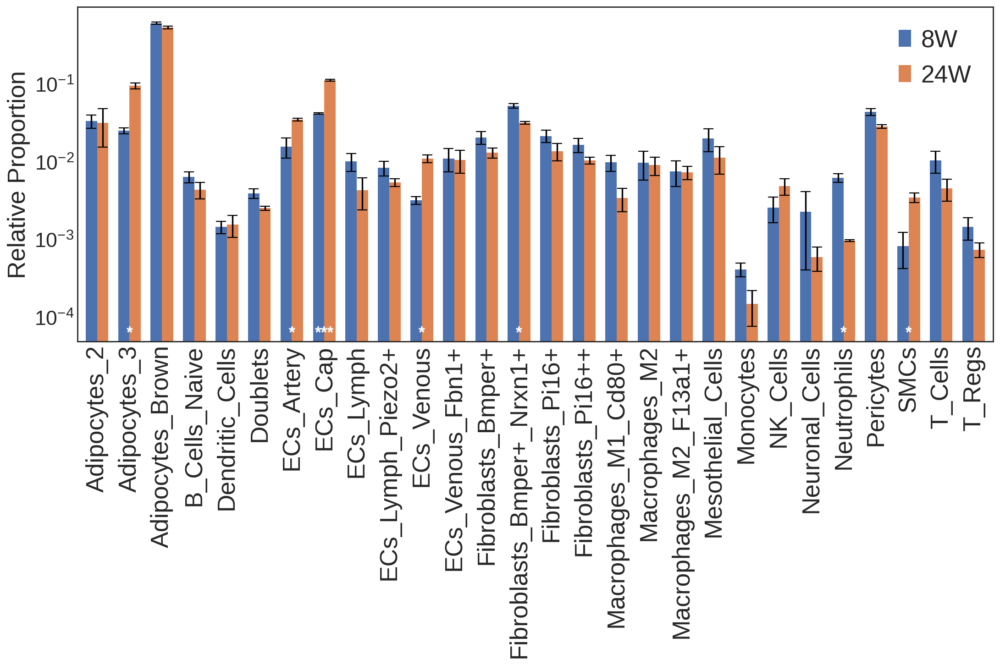

In [89]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

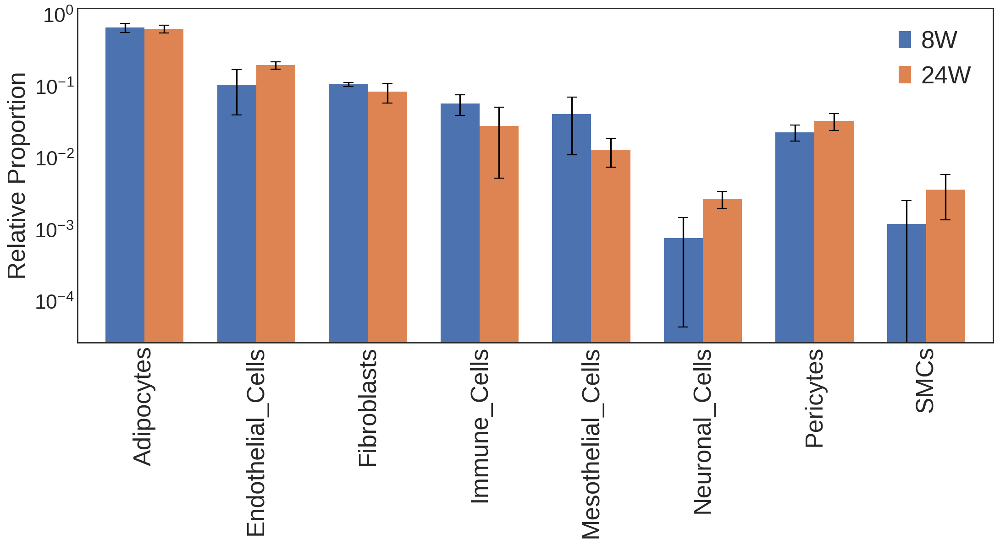

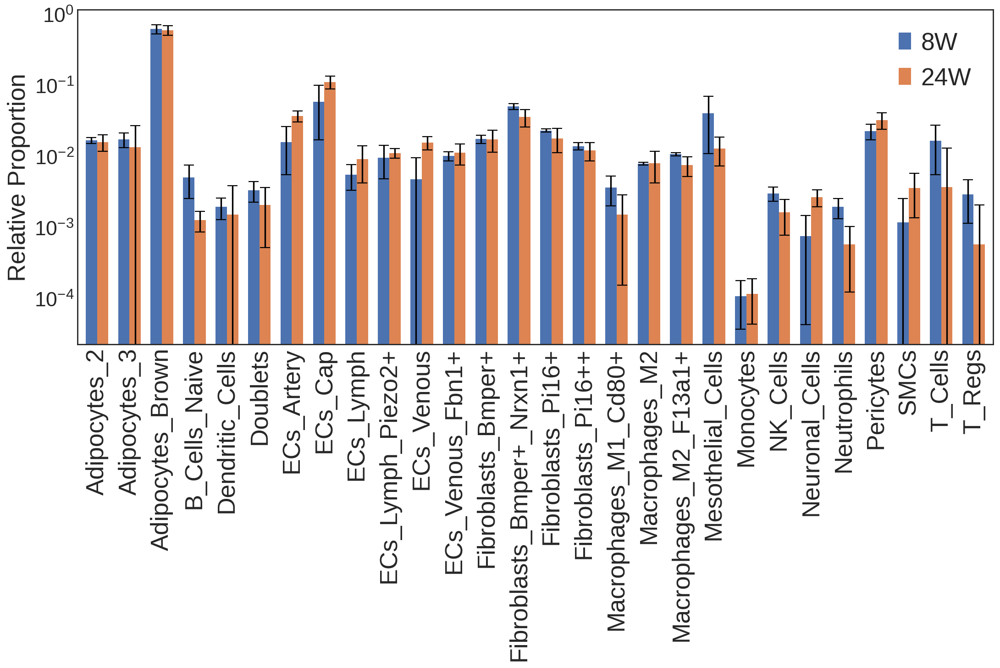

In [90]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'HF')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

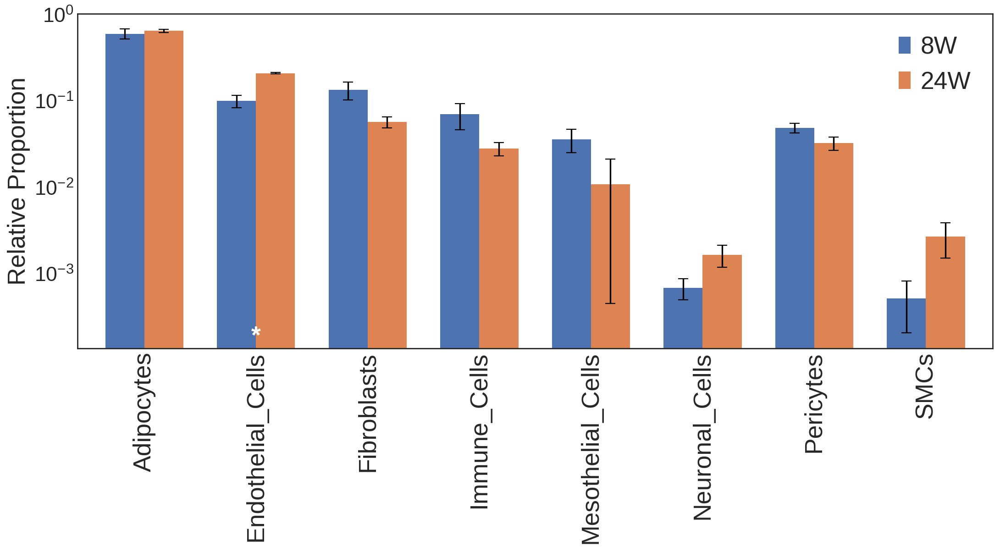

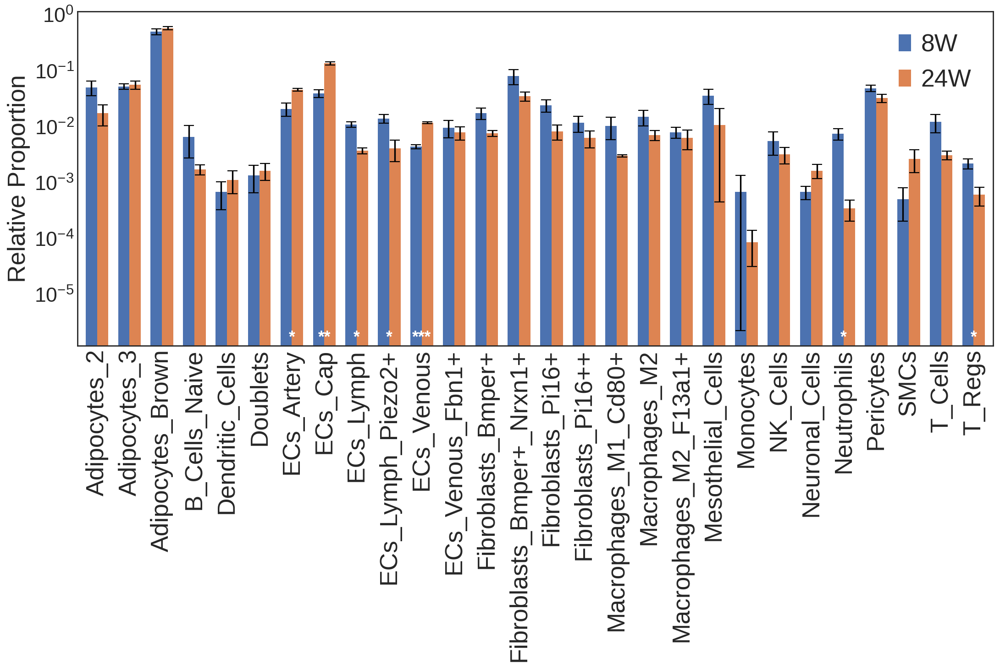

In [91]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

group2 does not contain Monocytes


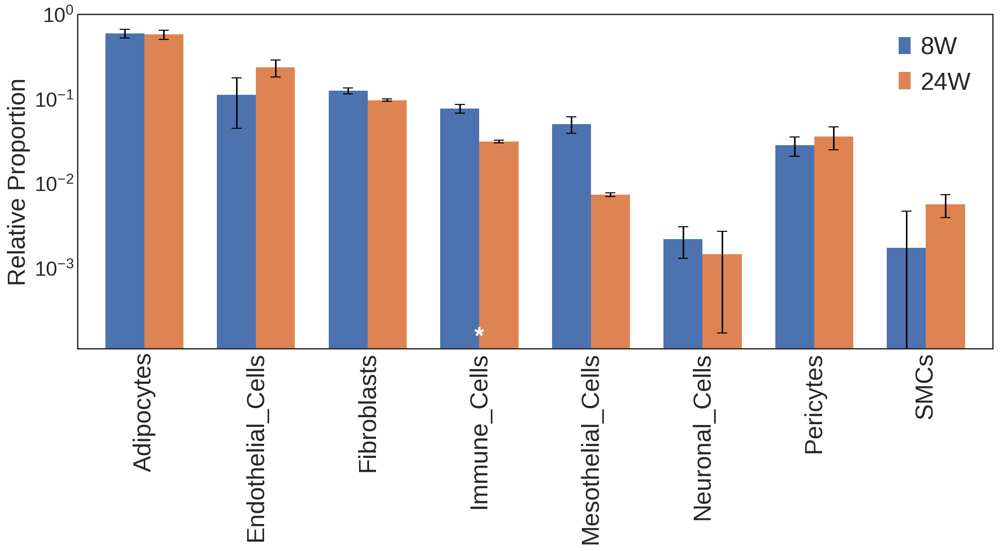

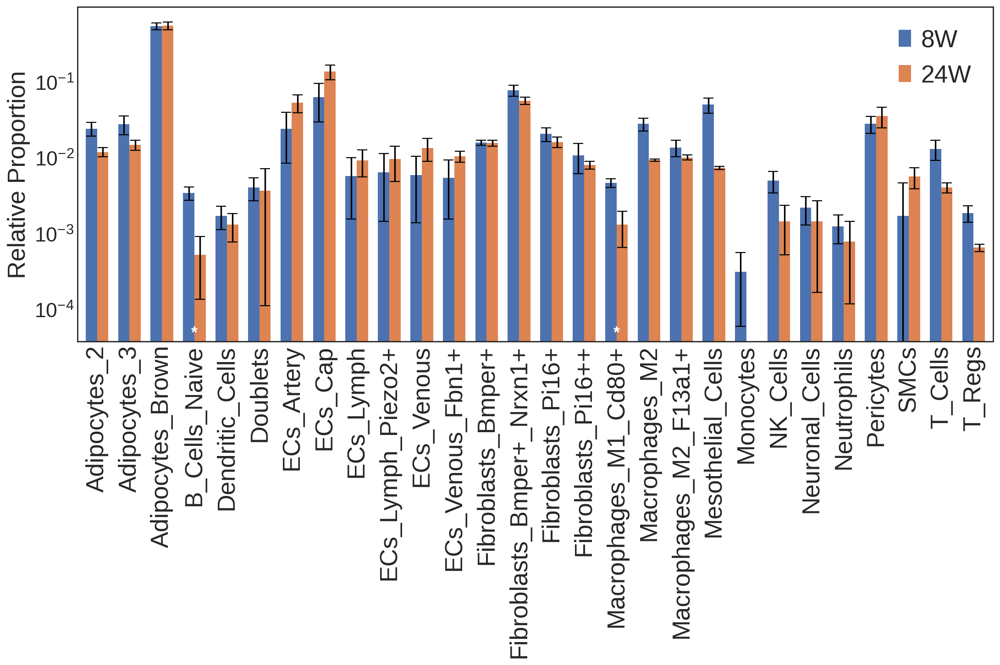

In [92]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.diet == 'Control')], 
                group = 'time', 
                group1 = '8W', 
                group2 = '24W', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

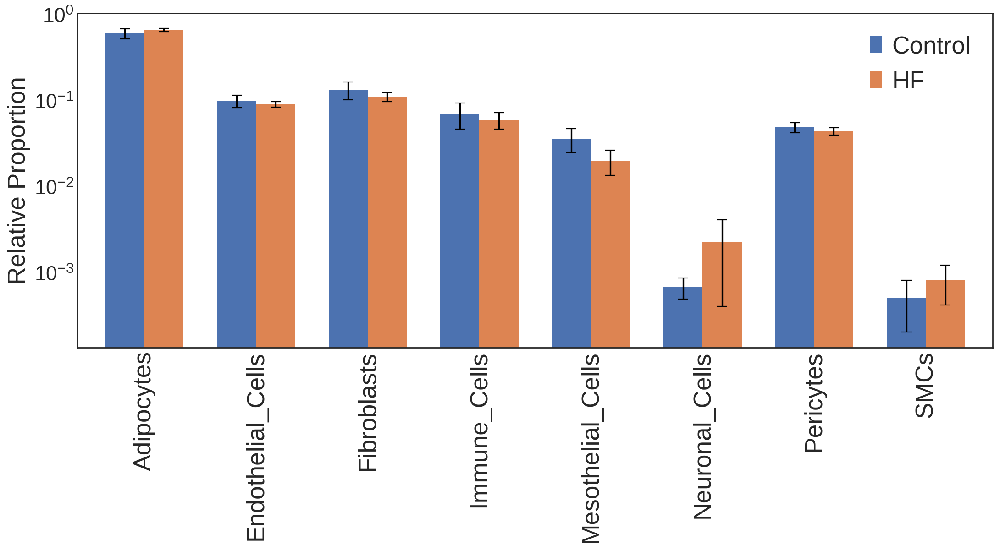

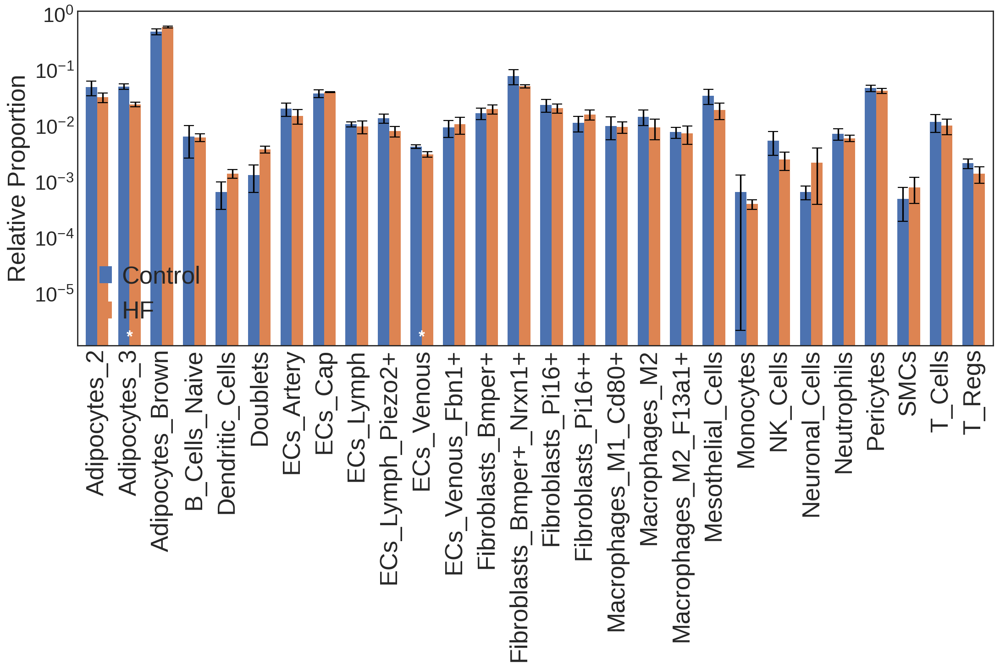

In [93]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

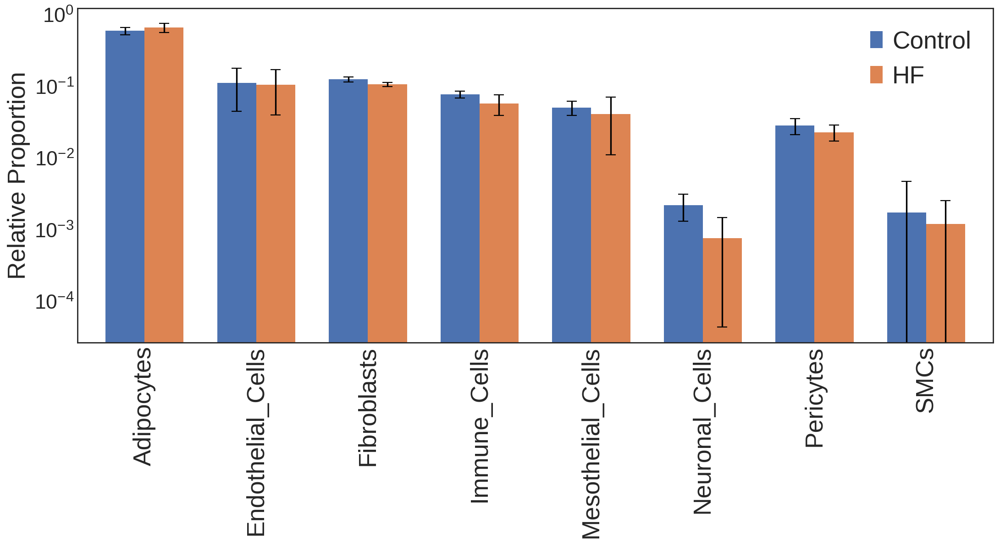

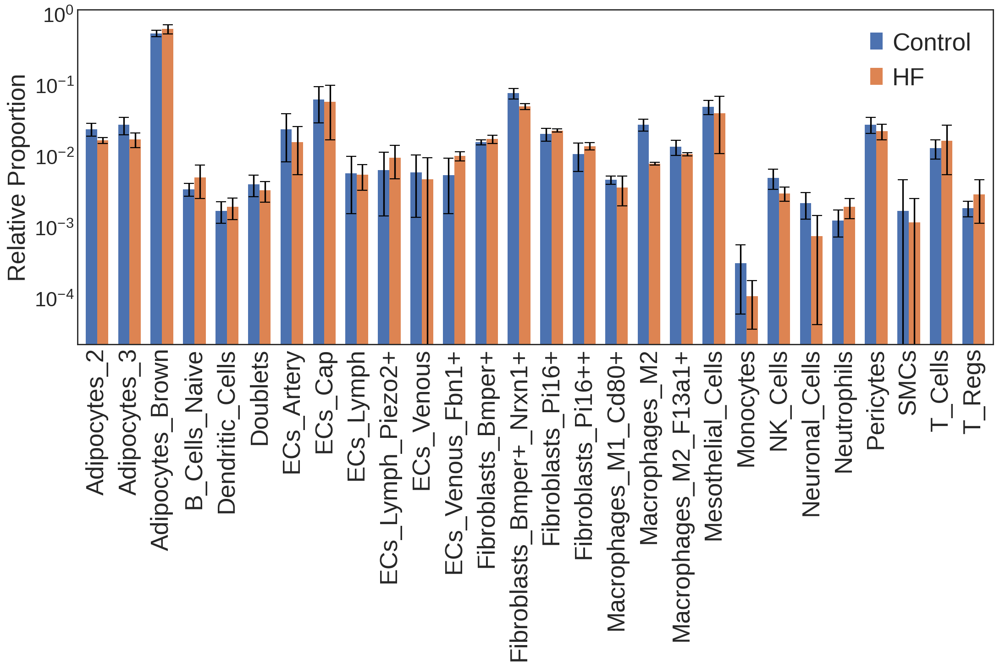

In [94]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '8W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

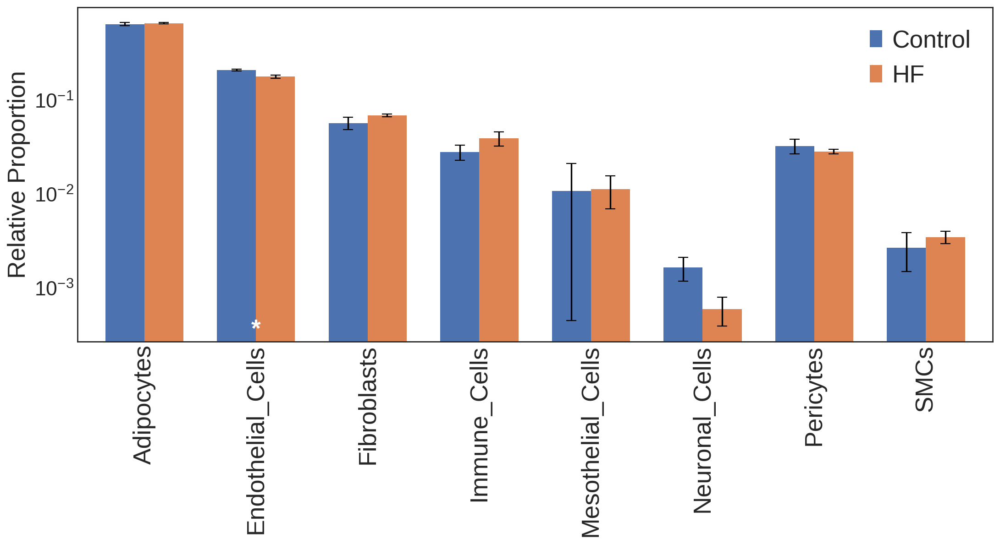

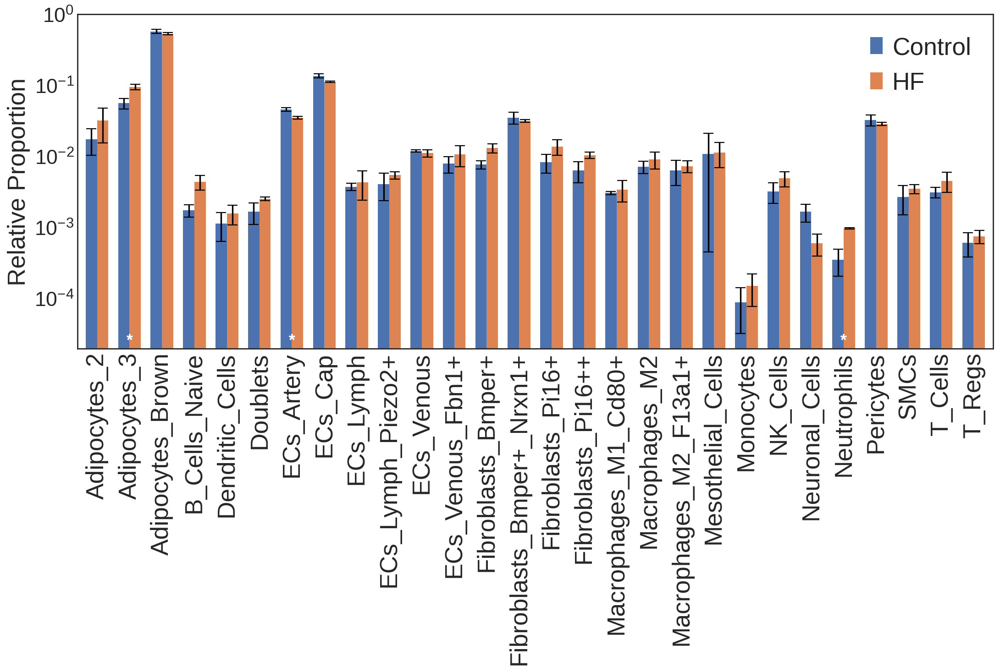

In [95]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'M') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

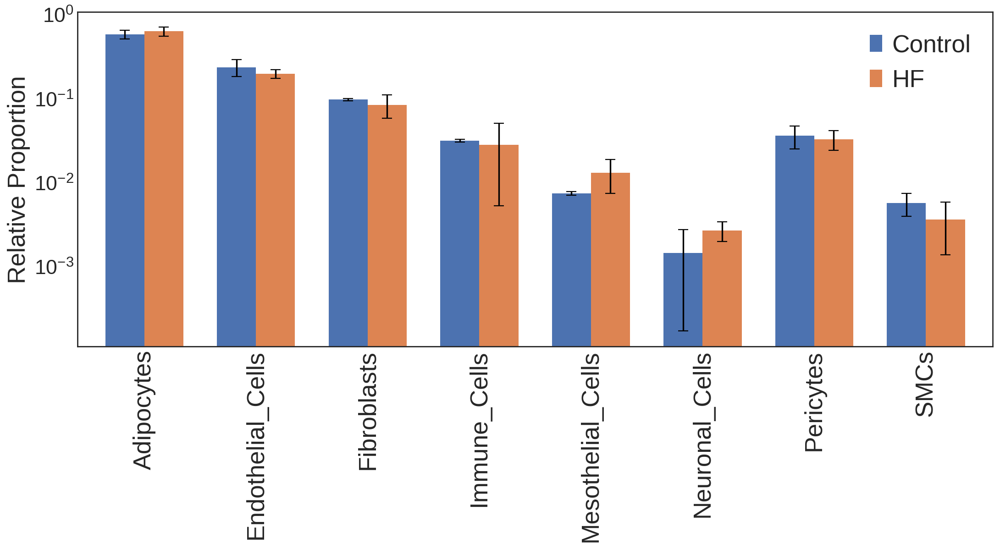

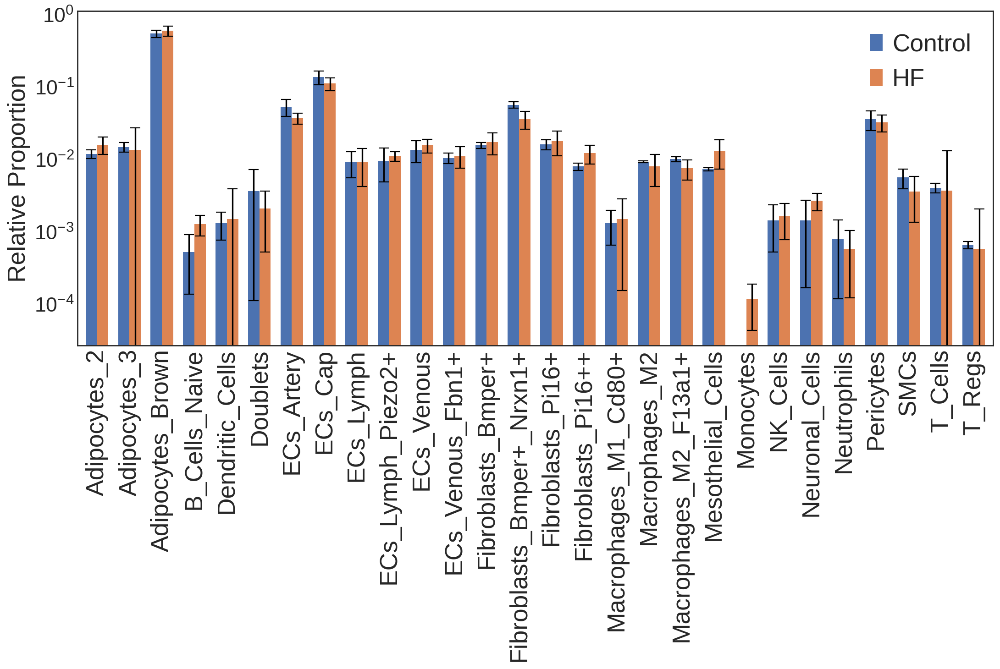

In [96]:
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype_broad', 
                sample_id_col = 'sample_id', 
                error_bars = True)
proportions_df1, proportions_df2 = proportion_plot(adata = adata[(adata.obs.sex == 'F') & (adata.obs.time == '24W')], 
                group = 'diet', 
                group1 = 'Control', 
                group2 = 'HF', 
                leiden_col = 'celltype', 
                sample_id_col = 'sample_id', 
                error_bars = True)

## Differences between proportions (meta-comparisons)

In [4]:
df_len = len(adata.obs.sample_id.unique()) * len(adata.obs.celltype_broad.unique())
df = pd.DataFrame(index=range(df_len),
                  columns = ['sample_id', 'tissue', 'diet', 'time', 'sex', 'celltype', 'celltype_number', 'total_number'])

i = 0
for sample_id in adata.obs.sample_id.unique():
    df_sample = adata.obs[adata.obs.sample_id == sample_id]
    for celltype in adata.obs.celltype_broad.unique():
            df.sample_id.iloc[i] = sample_id
            df.celltype.iloc[i] = celltype
            df.tissue.iloc[i] = df_sample.tissue.iloc[0]
            df.diet.iloc[i] = df_sample.diet.iloc[0]
            df.time.iloc[i] = df_sample.time.iloc[0]
            df.sex.iloc[i] = df_sample.sex.iloc[0]
            df.total_number.iloc[i] = len(df_sample)
            df.celltype_number.iloc[i] = len(df_sample[df_sample.celltype_broad == celltype])
            i+=1
df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936


In [5]:
### Calculate proportion for each row
df['proportion'] = df.celltype_number / df.total_number

# convert columns to numeric
df[["celltype_number", "total_number", "proportion"]] = df[["celltype_number", "total_number", "proportion"]].apply(pd.to_numeric)

df['sample_type'] = df.tissue + '_'+ df.diet + '_' + df.time + '_' + df.sex

df['mean_by_celltype'] = df.groupby(['celltype', 'sample_type'])['proportion'].transform('mean')
df['sem_by_celltype'] = df.groupby(['celltype', 'sample_type'])['proportion'].transform('sem')

df.head()

,sample_id,tissue,diet,time,sex,celltype,celltype_number,total_number,proportion,sample_type,mean_by_celltype,sem_by_celltype
0,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Fibroblasts,383,1936,0.197831,taPVAT_Control_8W_M,0.139554,0.031597
1,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Adipocytes,913,1936,0.471591,taPVAT_Control_8W_M,0.584616,0.082261
2,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Immune_Cells,207,1936,0.106921,taPVAT_Control_8W_M,0.077689,0.023747
3,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Endothelial_Cells,238,1936,0.122934,taPVAT_Control_8W_M,0.105897,0.016475
4,P_CTRL_8W_M_01,taPVAT,Control,8W,M,Pericytes,119,1936,0.061467,taPVAT_Control_8W_M,0.050596,0.006435


In [6]:
df_ctrl_m = df[(df.sex == 'M') & (df.diet == 'Control')].reset_index() ###Includes both 8W and 24W data
df_hf_m = df[(df.sex == 'M') & (df.diet == 'HF')].reset_index()
df_ctrl_f = df[(df.sex == 'F') & (df.diet == 'Control')].reset_index()
df_hf_f = df[(df.sex == 'F') & (df.diet == 'HF')].reset_index()

In [7]:
def make_df_diff(df, group, group1, group2, sample_type_name):
    df_diff = pd.DataFrame(index=range(8), columns = ['sample_type', 'celltype', 'prop_diff', 'se', 'dof'])
    
    i = 0
    for celltype in df.celltype.unique():
        df_x = df[(df.celltype == celltype) & (df[group] == group1)]
        df_y = df[(df.celltype == celltype) & (df[group] == group2)]

        prop1 = df_x.mean_by_celltype.values[0]
        prop2 = df_y.mean_by_celltype.values[0]
        prop_diff = prop2 - prop1 ###24W - 8W or HF - Control or F - M

        ### standard error of the differences between means calculation
        nx = len(df_x)
        ny = len(df_y)

        s2x = np.var(df_x.proportion.values, ddof = 1)
        s2y = np.var(df_y.proportion.values, ddof = 1)
        
        ### Welch's standard error
        se = (s2x/nx + s2y/ny)**(0.5)
        results = stats.ttest_ind(df_x.proportion.values, df_y.proportion.values, equal_var = False)

        ### Add data to the dataframe
        df_diff.iloc[i, 0] = sample_type_name
        df_diff.iloc[i, 1] = celltype
        df_diff.iloc[i, 2] = prop_diff
        df_diff.iloc[i, 3] = se
        df_diff.iloc[i, 4] = results.df
        i += 1
    return df_diff

In [8]:
df_diff_ctrl_m = make_df_diff(df_ctrl_m, 'time', '8W', '24W', 'taPVAT_Control_M_(24W-8W)')
df_diff_hf_m = make_df_diff(df_hf_m, 'time', '8W', '24W', 'taPVAT_HF_M_(24W-8W)')
df_diff_ctrl_f = make_df_diff(df_ctrl_f, 'time', '8W', '24W', 'taPVAT_Control_F_(24W-8W)')
df_diff_hf_f = make_df_diff(df_hf_f, 'time', '8W', '24W', 'taPVAT_HF_F_(24W-8W)')

In [9]:
df_comb = pd.concat([df_diff_ctrl_m, df_diff_hf_m, df_diff_ctrl_f, df_diff_hf_f], ignore_index= True)

In [27]:
p_list = []
i = 0
j = 16
for celltype in df_comb_sorted.celltype.unique():
    ### Standard Error of the Difference Between Differences
    se_diff_m = (df_comb_sorted.se[i+8]**2 + df_comb_sorted.se[i+24]**2)**(0.5)
    #se_diff_f = (df_comb_sorted.se[j]**2 + df_comb_sorted.se[j+8]**2)**(0.5)
    t_m = (df_comb_sorted.prop_diff[i+8] - df_comb_sorted.prop_diff[i+24])/se_diff_m ###Control - HF. The order doesn't actually matter because it's a two-sided t-test.
    #t_f = (df_comb_sorted.prop_diff[j] - df_comb_sorted.prop_diff[j+8])/se_diff_f
    ### Approximation of the degrees of freedom based on the Welch-Satterthwaite equation.
    dof_m = np.floor((df_comb_sorted.se[i+8]**2 + df_comb_sorted.se[i+24]**2)**2 \
                   / ((df_comb_sorted.se[i+8]**4 / df_comb_sorted.dof[i+8]) + (df_comb_sorted.se[i+24]**4 / df_comb_sorted.dof[i+24])))
    # dof_f = np.floor((df_comb_sorted.se[j]**2 + df_comb_sorted.se[j+8]**2)**2 \
    #                / ((df_comb_sorted.se[j]**4 / df_comb_sorted.dof[j]) + (df_comb_sorted.se[j+8]**4 / df_comb_sorted.dof[j+8])))
    p_val_m = stats.t.sf(abs(t_m), dof_m) * 2
    #p_val_f = stats.t.sf(abs(t_f), dof_f) * 2
    p_list.append(p_val_m)
    #p_list.append(p_val_f)
    print(celltype)
    print(i)
    #print(j)
    print(df_comb_sorted.sample_type[i] + ' , ' + df_comb_sorted.celltype[i])
    #print(df_comb_sorted.sample_type[j] + ' , ' + df_comb_sorted.celltype[j])
    print(df_comb_sorted.sample_type[i+16] + ' , ' + df_comb_sorted.celltype[i+16])
    #print(df_comb_sorted.sample_type[j+8] + ' , ' + df_comb_sorted.celltype[j+8])
    print(p_list)
    i+=1
    j+=1

Adipocytes
0
taPVAT_Control_M_(24W-8W) , Adipocytes
taPVAT_Control_F_(24W-8W) , Adipocytes
[0.7874487481685845]
Endothelial_Cells
1
taPVAT_Control_M_(24W-8W) , Endothelial_Cells
taPVAT_Control_F_(24W-8W) , Endothelial_Cells
[0.7874487481685845, 0.6030529693226127]
Fibroblasts
2
taPVAT_Control_M_(24W-8W) , Fibroblasts
taPVAT_Control_F_(24W-8W) , Fibroblasts
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369]
Immune_Cells
3
taPVAT_Control_M_(24W-8W) , Immune_Cells
taPVAT_Control_F_(24W-8W) , Immune_Cells
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369, 0.9941825198494854]
Pericytes
4
taPVAT_Control_M_(24W-8W) , Pericytes
taPVAT_Control_F_(24W-8W) , Pericytes
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369, 0.9941825198494854, 0.07140342702930554]
Mesothelial_Cells
5
taPVAT_Control_M_(24W-8W) , Mesothelial_Cells
taPVAT_Control_F_(24W-8W) , Mesothelial_Cells
[0.7874487481685845, 0.6030529693226127, 0.8524495450144369, 0.9941825198494854, 0.07140342702930554

In [28]:
p_list

[0.7874487481685845,
 0.6030529693226127,
 0.8524495450144369,
 0.9941825198494854,
 0.07140342702930554,
 0.45203393623729793,
 0.5366680627268428,
 0.23637633984468545]

In [14]:
df_comb_sorted

,sample_type,celltype,prop_diff,se,dof
0,taPVAT_Control_M_(24W-8W),Adipocytes,0.05378,0.086014,2.37008
1,taPVAT_Control_M_(24W-8W),Endothelial_Cells,0.103038,0.017048,2.281461
2,taPVAT_Control_M_(24W-8W),Fibroblasts,-0.077195,0.032728,2.289926
3,taPVAT_Control_M_(24W-8W),Immune_Cells,-0.046149,0.024282,2.182088
4,taPVAT_Control_M_(24W-8W),Pericytes,-0.014395,0.008643,3.953129
5,taPVAT_Control_M_(24W-8W),Mesothelial_Cells,-0.023195,0.015239,3.986593
6,taPVAT_Control_M_(24W-8W),SMCs,0.002874,0.001234,2.26531
7,taPVAT_Control_M_(24W-8W),Neuronal_Cells,0.00124,0.000512,2.599298
8,taPVAT_HF_M_(24W-8W),Adipocytes,-0.007044,0.028835,2.620007
9,taPVAT_HF_M_(24W-8W),Endothelial_Cells,0.091111,0.009641,3.996337


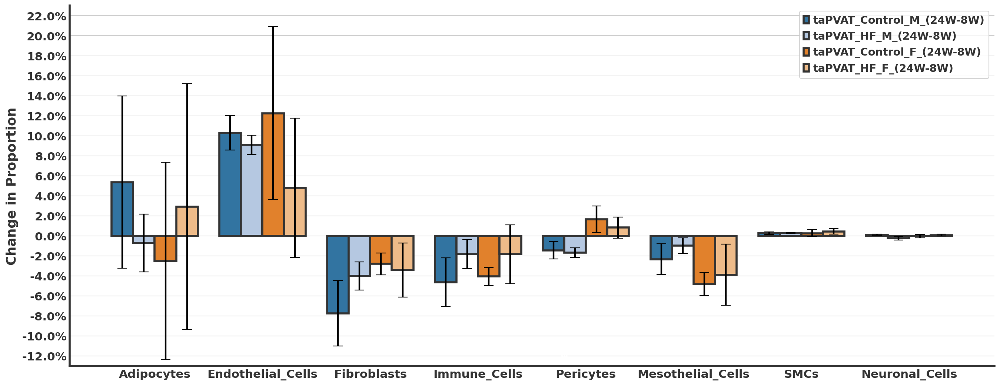

In [16]:
plt.figure(figsize = (20,8))
plt.style.use("seaborn-whitegrid")

group_order = ['taPVAT_Control_M_(24W-8W)','taPVAT_HF_M_(24W-8W)','taPVAT_Control_F_(24W-8W)','taPVAT_HF_F_(24W-8W)']

cell_type_order = ['Adipocytes',  'Endothelial_Cells', 'Fibroblasts', 'Immune_Cells',
                   'Pericytes', 'Mesothelial_Cells',  'SMCs', 'Neuronal_Cells']

df_comb_sorted_1 = df_comb.set_index(['celltype']).loc[cell_type_order].reset_index()
df_comb_sorted = df_comb_sorted_1.set_index(['sample_type']).loc[group_order].reset_index()

ax = sns.barplot(data = df_comb_sorted, x = 'celltype', y = 'prop_diff', capsize = 0.06, edgecolor = '0.2', lw = 2.5, ci = None, 
                palette = 'tab20', hue = 'sample_type', hue_order = group_order)

bars = ax.patches
for bar, ci in zip(bars, df_comb_sorted.se):
    x = bar.get_x() + bar.get_width() / 2  # X-coordinate of the bar's center
    y = bar.get_height()  # Height of the bar
    ax.errorbar(x, y, yerr=ci, capsize=6, linewidth = 2, color='black', fmt='none')

prev_lim = ax.get_ylim()[1]

#max_val = max(vals)

handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[0:], labels[0:], loc = 'upper right', # bbox_to_anchor = (1, 0), 
          ncol = 1, frameon = True, fontsize = 14, labelcolor = '0.2', prop = {'weight': 'bold'})


for axis in ['bottom', 'left']:
    ax.spines[axis].set_linewidth(2.5)
    ax.spines[axis].set_color('0.2')
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

#ax.set_yscale('log')
plt.xticks(size = 14, ha = 'center', weight = 'bold', color = '0.2')
plt.yticks(np.arange(-0.14, 0.26, 0.02), size = 14, weight = 'bold', color = '0.2')

ax.tick_params(width = 2.5, color = '0.2')

vals = ax.get_yticks()
ax.set_yticklabels(['{:,.1%}'.format(x) for x in vals])

plt.xlabel('')
plt.ylabel('Change in Proportion', size = 16, color = '0.2', weight = 'bold')

plt.ylim(-0.13, 0.23)


# Collect p-values
p_list = []
i = 0

for celltype in df_comb_sorted.celltype.unique():
    ### Standard Error of the Difference Between Differences
    se_diff = (df_comb_sorted.se[i]**2 + df_comb_sorted.se[i+1]**2)**(0.5)
    t = (df_comb_sorted.prop_diff[i] - df_comb_sorted.prop_diff[i+1])/se_diff ###Control - HF. The order doesn't actually matter because it's a two-sided t-test.
    ### Approximation of the degrees of freedom based on the Welch-Satterthwaite equation.
    dof = np.floor((df_comb_sorted.se[i]**2 + df_comb_sorted.se[i+1]**2)**2 \
                   / ((df_comb_sorted.se[i]**4 / df_comb_sorted.dof[i]) + (df_comb_sorted.se[i+1]**4 / df_comb_sorted.dof[i+1])))
    p_val = stats.t.sf(abs(t), dof) * 2
    p_list.append(p_val)
    i+=2
    
def annotate_graph(ax = ax, label = "label"):
    fontsize = 16
    ax.annotate(label,
               (patch.get_x() + patch.get_width(), ax.get_ylim()[0]), 
               ha='center', va='bottom', 
               fontsize = fontsize,
               weight = 'bold',
               color = 'white',
               xytext=(0, 0), 
               textcoords='offset points')

# Annotate bars with p-values
for p, patch in zip(p_list, ax.patches):
    if p < 0.001: 
        annotate_graph(ax, "***")
    elif p < 0.01:
        annotate_graph(ax, "**")
    elif p < 0.05:
        annotate_graph(ax, "*")
    else:
        annotate_graph(ax, "")
        
plt.savefig('../output/taPVAT_barplot_comparing_diet_differences_over_time_all_samples.svg', bbox_inches = 'tight')
#plt.savefig('../output/barplot.png', bbox_inches = 'tight', dpi = 600, facecolor = ax.get_facecolor())
plt.show()